# Ramesh Gopinath's Unsupervised Learning AIML Project

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import json

from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans

from scipy.stats import zscore

# Part A - Automobile

# 1 Data Understanding and Exploration

In [2]:
# 1A...reading the csv file to a dataframe

Car_df = pd.read_csv("Car name.csv")

In [3]:
Car_df

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino
...,...
393,ford mustang gl
394,vw pickup
395,dodge rampage
396,ford ranger


In [4]:
# 1B...reading attributes json file into a dataframe

Car_attr_df = pd.read_json("Car-Attributes.json")

In [5]:
Car_attr_df

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1
...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86,2790,15.6,82,1
394,44.0,4,97.0,52,2130,24.6,82,2
395,32.0,4,135.0,84,2295,11.6,82,1
396,28.0,4,120.0,79,2625,18.6,82,1


In [6]:
print("Car name shape",Car_df.shape)
print("Car attr shape",Car_attr_df.shape)

Car name shape (398, 1)
Car attr shape (398, 8)


In [7]:
# 1C...Merging both dataframes to form a single dataframe

Car_final = pd.concat([Car_df, Car_attr_df], axis= 1)

In [8]:
# 1D... 5 point summary

Car_final.shape

(398, 9)

In [9]:
Car_final

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1
...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86,2790,15.6,82,1
394,vw pickup,44.0,4,97.0,52,2130,24.6,82,2
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
396,ford ranger,28.0,4,120.0,79,2625,18.6,82,1


In [10]:
Car_final.dtypes

car_name     object
mpg         float64
cyl           int64
disp        float64
hp           object
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

In [11]:
Car_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


In [12]:
Car_final.describe()

,mpg,cyl,disp,wt,acc,yr,origin
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,2970.424623,15.568090,76.010050,1.572864
std,7.815984,1.701004,104.269838,846.841774,2.757689,3.697627,0.802055
min,9.000000,3.000000,68.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.250000,2223.750000,13.825000,73.000000,1.000000
50%,23.000000,4.000000,148.500000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,3608.000000,17.175000,79.000000,2.000000
max,46.600000,8.000000,455.000000,5140.000000,24.800000,82.000000,3.000000


In [13]:
Car_final.corr()

,mpg,cyl,disp,wt,acc,yr,origin
mpg,1.000000,-0.775396,-0.804203,-0.831741,0.420289,0.579267,0.563450
cyl,-0.775396,1.000000,0.950721,0.896017,-0.505419,-0.348746,-0.562543
disp,-0.804203,0.950721,1.000000,0.932824,-0.543684,-0.370164,-0.609409
wt,-0.831741,0.896017,0.932824,1.000000,-0.417457,-0.306564,-0.581024
acc,0.420289,-0.505419,-0.543684,-0.417457,1.000000,0.288137,0.205873
yr,0.579267,-0.348746,-0.370164,-0.306564,0.288137,1.000000,0.180662
origin,0.563450,-0.562543,-0.609409,-0.581024,0.205873,0.180662,1.000000


<AxesSubplot:>

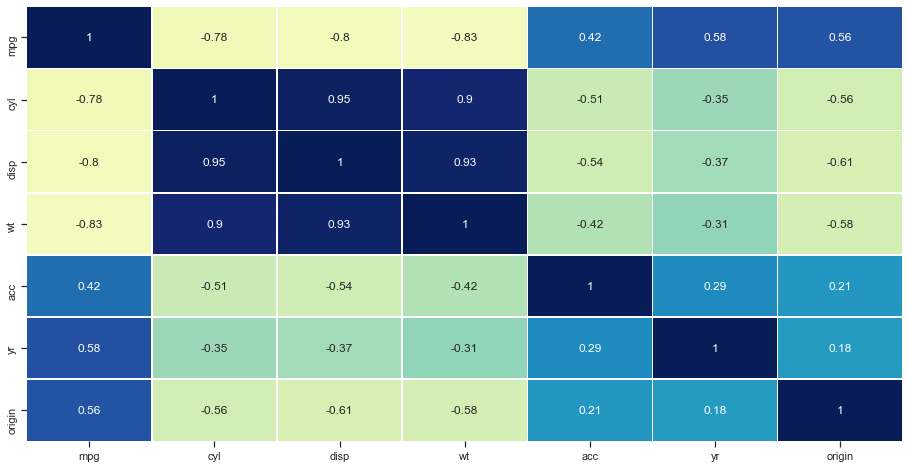

In [14]:
sns.set(rc={'figure.figsize':(15.7,8)})

sns.set(style="ticks", color_codes=True)

sns.heatmap(Car_final.corr(), annot=True, linewidths=0.5, center=0, cbar=False, cmap="YlGnBu")

 #...1F.... Insights .... There is multi-collinearity... 
    
    Miles per gallon is the Dependent variable and all others are Independent variables
    
    HP is also a numerical column but not shown in describe(), and shows up as an Object, meaning it has some missing values
    
    Displacement & Cylinder seems to be highly positively corelated ... 0.95
    Weight and Cylinder seems to be highty positively corelated        0.90
    Weight and Displacement seems to be highly positively corelated    0.93
    
    Weight and Miles per gallon are negatively corelated.............. 0.83
    Displacement and Miles per gallon are also negatively corelated... 0.80
    Cylinder and Miles per gallon are also negatively corelated ....   0.78
    
    

# 2. Data preparation and Analysis

#2A... feature wise percentage of missing values

In [15]:
car_percent_missing = Car_final.isnull().sum() * 100 / len(Car_final)
car_missing_value_df = pd.DataFrame({'column_name': Car_final.columns,
                                 'percent_missing': car_percent_missing})

In [16]:
car_missing_value_df

,column_name,percent_missing
car_name,car_name,0.0
mpg,mpg,0.0
cyl,cyl,0.0
disp,disp,0.0
hp,hp,0.0
wt,wt,0.0
acc,acc,0.0
yr,yr,0.0
origin,origin,0.0


In [17]:
for i in Car_final.columns:
    if i == 'car_name':
        print("")
    else:    
        print("column name",i)
        print("")
        print("Unique values",Car_final[i].unique())
        print("")
        print("null values",Car_final[i].isnull().sum())
        print("na values",Car_final[i].isna().sum())
        print("% S unique values",Car_final[i].value_counts())
        print("")
    


column name mpg

Unique values [18.  15.  16.  17.  14.  24.  22.  21.  27.  26.  25.  10.  11.   9.
 28.  19.  12.  13.  23.  30.  31.  35.  20.  29.  32.  33.  17.5 15.5
 14.5 22.5 24.5 18.5 29.5 26.5 16.5 31.5 36.  25.5 33.5 20.5 30.5 21.5
 43.1 36.1 32.8 39.4 19.9 19.4 20.2 19.2 25.1 20.6 20.8 18.6 18.1 17.7
 27.5 27.2 30.9 21.1 23.2 23.8 23.9 20.3 21.6 16.2 19.8 22.3 17.6 18.2
 16.9 31.9 34.1 35.7 27.4 25.4 34.2 34.5 31.8 37.3 28.4 28.8 26.8 41.5
 38.1 32.1 37.2 26.4 24.3 19.1 34.3 29.8 31.3 37.  32.2 46.6 27.9 40.8
 44.3 43.4 36.4 44.6 40.9 33.8 32.7 23.7 23.6 32.4 26.6 25.8 23.5 39.1
 39.  35.1 32.3 37.7 34.7 34.4 29.9 33.7 32.9 31.6 28.1 30.7 24.2 22.4
 34.  38.  44. ]

null values 0
na values 0
% S unique values 13.0    20
14.0    19
18.0    17
15.0    16
26.0    14
        ..
26.5     1
19.1     1
33.8     1
28.1     1
31.8     1
Name: mpg, Length: 129, dtype: int64

column name cyl

Unique values [8 4 6 3 5]

null values 0
na values 0
% S unique values 4    204
8    103
6  

In [18]:
Car_final.describe(include=object)

,car_name,hp
count,398,398
unique,305,94
top,ford pinto,150
freq,6,22


In [19]:
# 2B..... Checking for Duplicated rows in the dataset

Car_final.duplicated().sum()

0

In [ ]:
#There are no duplicated rows in the dataset

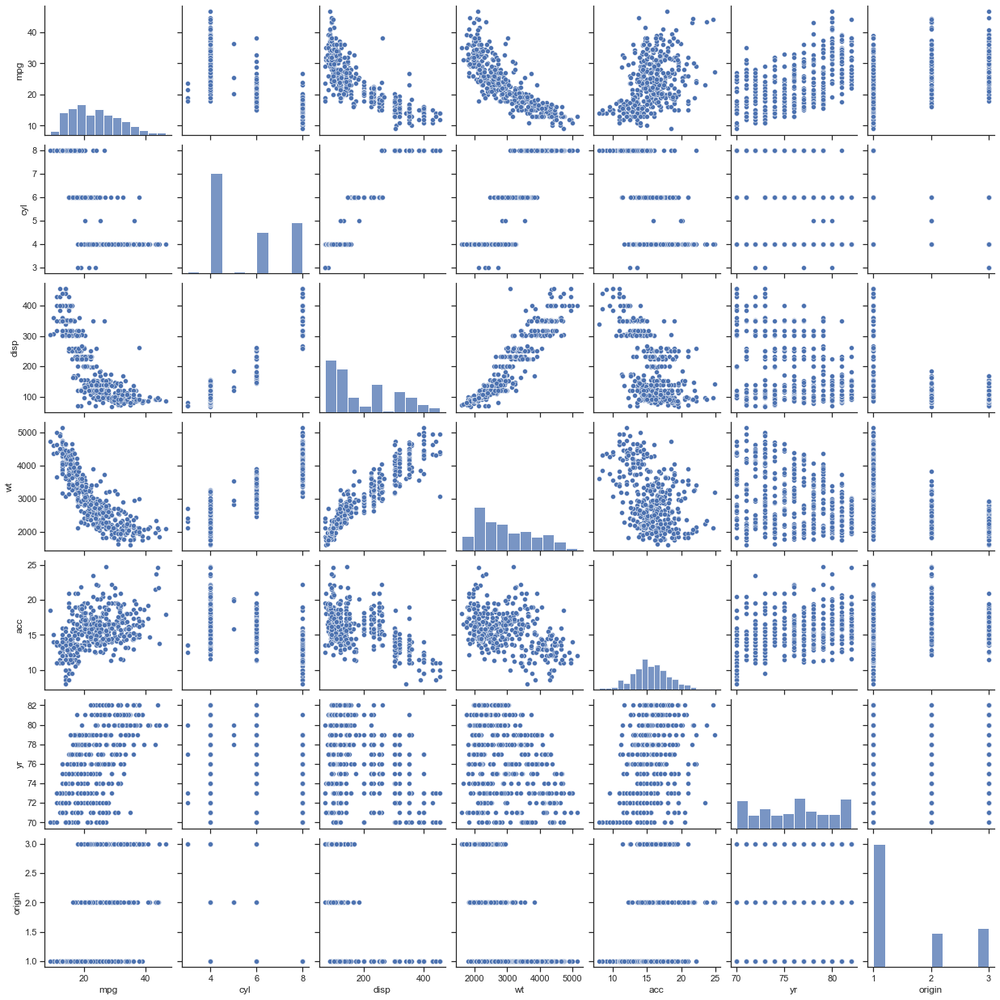

In [20]:
# 2C......... Pairplot for all features

sns.set(rc={'figure.figsize':(18.7,1200.27)})

sns. set(style="ticks", color_codes=True)

sns.pairplot(Car_final);

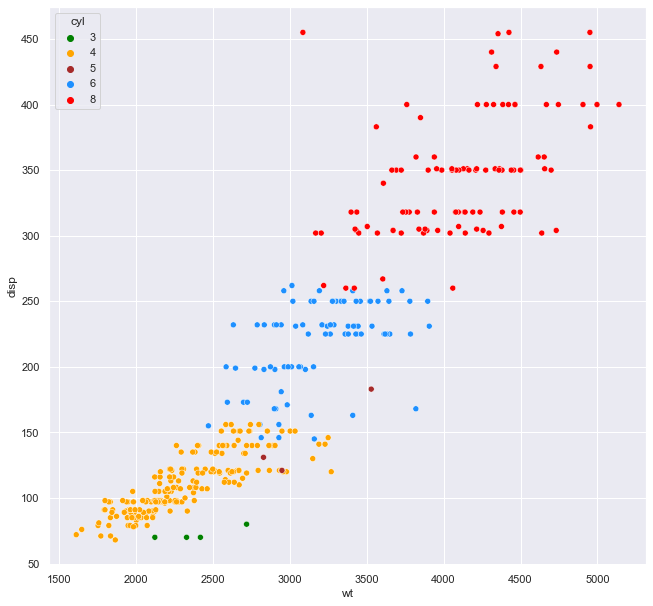

In [21]:
# 2D......... Scatterplot with Weight and displacement

sns.set(rc={'figure.figsize':(10.7,10.27)})

g =sns.scatterplot(x="wt", y="disp",
              hue="cyl",
              data=Car_final,
                  palette=['green','orange','brown','dodgerblue','red'], legend='full')


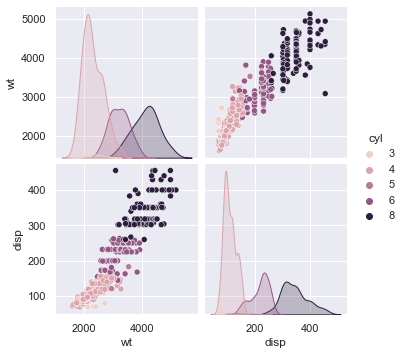

In [22]:
sns.set(rc={'figure.figsize':(30.7,30.27)})

cols = Car_final[['wt','disp','cyl']]
sns.pairplot(cols, hue='cyl')

In [ ]:
# 2E....Insights on scatterplot between weight and displacement

Weight and Displacement looks to be positively correlated and as the Cylinders keep increasing for every unit weight increase
there is a proportionate increase in the displacement...... 

As found out earlier in the correlation heatmap, Weight and displacement has a 0.93 corelation which is pretty close to 1

small number of cylinders seem to be used in lesser weight cars while higher number of cylinders are used in heavier cars

There are only a handfull of 3 cylinder and 5 cylinder cars, while 4, 6 and 8 cylinder cars are in plenty

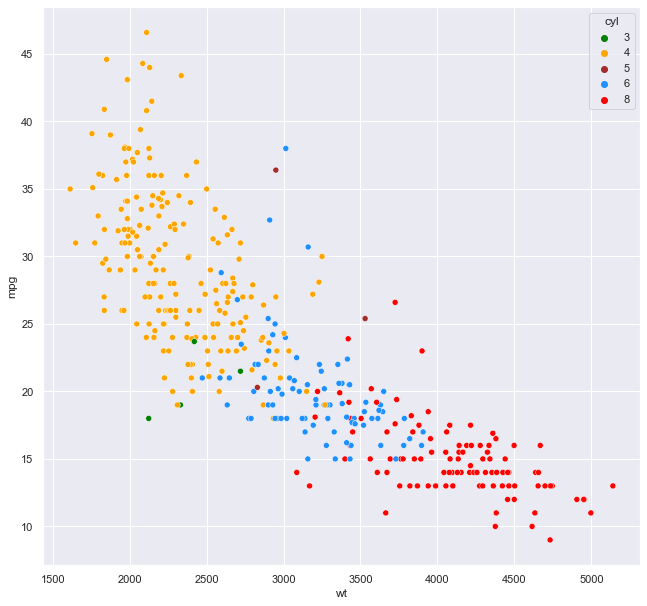

In [23]:
# 2F... Scatterplot with weight and miles per gallon

sns.set(rc={'figure.figsize':(10.7,10.27)})

g =sns.scatterplot(x="wt", y="mpg",
              hue="cyl",
              data=Car_final,
                  palette=['green','orange','brown','dodgerblue','red'], legend='full')


In [ ]:
!pip install plotly

In [24]:
import plotly.express as px

In [25]:
fig = px.scatter_3d(Car_final,x="cyl", y="disp", z="wt", color="mpg")
fig.show()

In [93]:
#  2G.... Insights on Weight and Miles per gallon

# Weight and Miles per gallon are (Negatively) correlated..... As the weight of the car increases the Fuel efficiency decreases.

# There is a -(0.83) correlation, not as strong as weight and displacement but still good enough.

# Lighter cars are more Fuel efficient with higher miles per gallon while Heavier cars are bad at Fuel efficiency and gives
# lesser Miles per gallon.

# Heavier cars tend to have higher number of Cylinders

In [26]:
# 2H........ Checking for Unexpected values in the dataset

Car_final.loc[Car_final["hp"] == '?'].value_counts()

car_name              mpg   cyl  disp   hp  wt    acc   yr  origin
amc concord dl        23.0  4    151.0  ?   3035  20.5  82  1         1
ford maverick         21.0  6    200.0  ?   2875  17.0  74  1         1
ford mustang cobra    23.6  4    140.0  ?   2905  14.3  80  1         1
ford pinto            25.0  4    98.0   ?   2046  19.0  71  1         1
renault 18i           34.5  4    100.0  ?   2320  15.8  81  2         1
renault lecar deluxe  40.9  4    85.0   ?   1835  17.3  80  2         1
dtype: int64

In [27]:
Car_final['hp'].replace("?",np.nan, inplace=True)

# 6 rows contain ?, impute approach is to replace with median values

Car_final['hp'].fillna((Car_final['hp'].median()), inplace=True)
Car_final['hp'] = Car_final['hp'].astype('float')


In [28]:
Car_final.describe(include=object)

,car_name
count,398
unique,305
top,ford pinto
freq,6


In [47]:
Car_final.dtypes

car_name     object
mpg         float64
cyl           int64
disp        float64
hp          float64
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

In [48]:
Car_final.describe()

,mpg,cyl,disp,hp,wt,acc,yr,origin
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,104.304020,2970.424623,15.568090,76.010050,1.572864
std,7.815984,1.701004,104.269838,38.222625,846.841774,2.757689,3.697627,0.802055
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.250000,76.000000,2223.750000,13.825000,73.000000,1.000000
50%,23.000000,4.000000,148.500000,93.500000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,125.000000,3608.000000,17.175000,79.000000,2.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,82.000000,3.000000


C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='hp', ylabel='Density'>

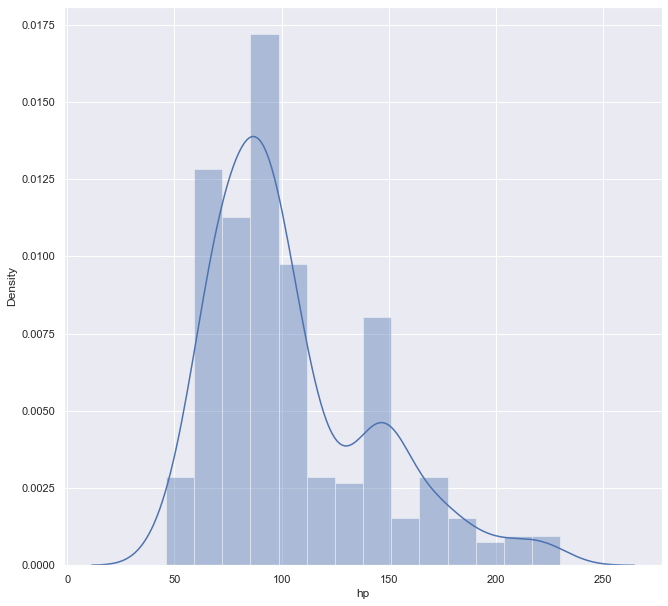

In [29]:
sns.distplot(Car_final['hp'])

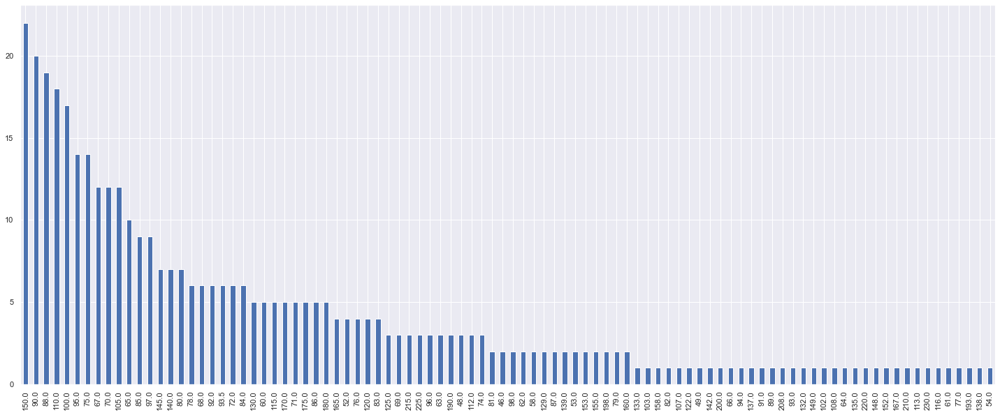

In [30]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(10)

pd.value_counts(Car_final["hp"]).plot(kind="bar")
plt.show()

In [312]:
Car_final.describe()

,mpg,cyl,disp,hp,wt,acc,yr,origin,Category
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,104.304020,2970.424623,15.568090,76.010050,1.572864,1.572864
std,7.815984,1.701004,104.269838,38.222625,846.841774,2.757689,3.697627,0.802055,1.288769
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,70.000000,1.000000,0.000000
25%,17.500000,4.000000,104.250000,76.000000,2223.750000,13.825000,73.000000,1.000000,1.000000
50%,23.000000,4.000000,148.500000,93.500000,2803.500000,15.500000,76.000000,1.000000,1.000000
75%,29.000000,8.000000,262.000000,125.000000,3608.000000,17.175000,79.000000,2.000000,3.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,82.000000,3.000000,4.000000


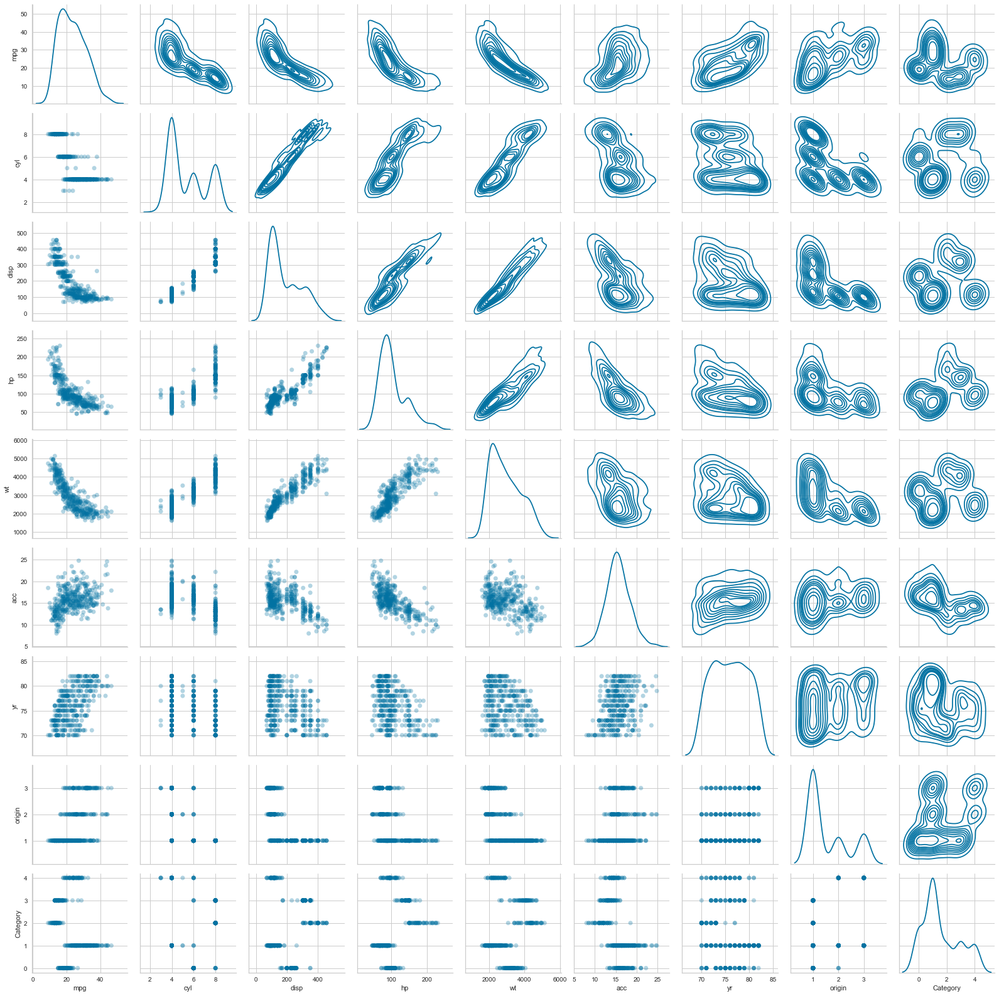

In [313]:
g = sns.PairGrid(Car_final, diag_sharey=False)
g.map_lower(sns.scatterplot, alpha=0.3, edgecolor='none')
g.map_diag(sns.kdeplot)
g.map_upper(sns.kdeplot)

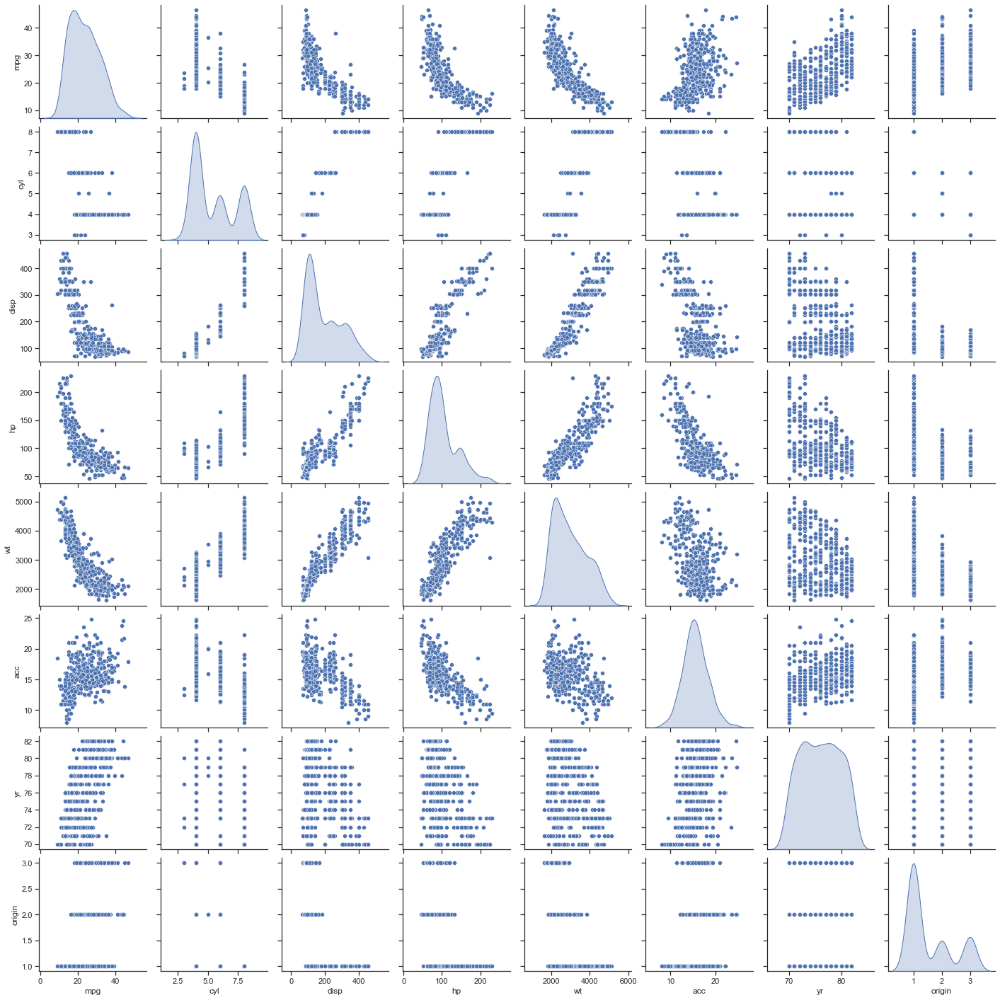

In [50]:
#  This pairplot will include hp also.

sns.set(rc={'figure.figsize':(18.7,1200.27)})

sns.set(style="ticks", color_codes=True)

sns.pairplot(Car_final, diag_kind='kde');

<AxesSubplot:>

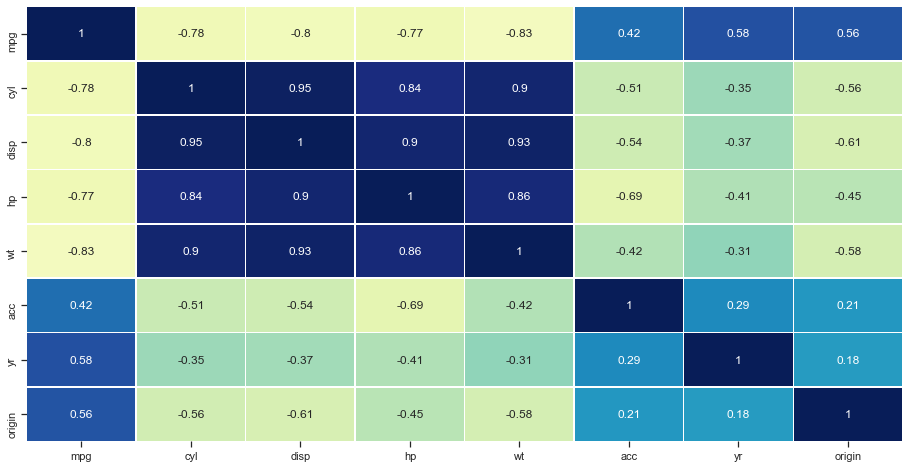

In [56]:
#........ Re-vizualizing the Heatmap of co-relation including hp

sns.set(rc={'figure.figsize':(15.7,8)})

sns.set(style="ticks", color_codes=True)

sns.heatmap(Car_final.corr(), annot=True, linewidths=0.5, center=0, cbar=False, cmap="YlGnBu")

In [ ]:
# .... hp and displacement has postive co-relation ... 0.90
# ..... hp and weight has positve co-relation ....     0.86
# ..... hp and cylinder has a positive co-relation ... 0.84 

In [31]:
#..... 

Car_With_noName=Car_final.iloc[:,1:]    # ....... Excluding car name from the dataset
Car_Scaled=Car_With_noName.apply(zscore)  #.....  applying Z score to scale the data since Wt has huge numbers

In [32]:
Car_Scaled

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,-0.715145
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,-0.715145
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,-0.715145
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,-0.715145
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,-0.715145
...,...,...,...,...,...,...,...,...
393,0.446497,-0.856321,-0.513026,-0.479482,-0.213324,0.011586,1.621983,-0.715145
394,2.624265,-0.856321,-0.925936,-1.370127,-0.993671,3.279296,1.621983,0.533222
395,1.087017,-0.856321,-0.561039,-0.531873,-0.798585,-1.440730,1.621983,-0.715145
396,0.574601,-0.856321,-0.705077,-0.662850,-0.408411,1.100822,1.621983,-0.715145


# 3 Clustering

In [30]:
# 3A.... Applying K-means clustering........ going with a range between 2 to 10 clusters

k_range = range(2,10)
errors = []
for k in k_range:
    clusters = KMeans(k, n_init = 5)
    clusters.fit(Car_Scaled)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    errors.append(clusters.inertia_)

clusters_df = pd.DataFrame({"k": k_range, "cluster_errors": errors})
#clusters_df[0:15]
clusters_df

,k,cluster_errors
0,2,1588.592457
1,3,1190.043653
2,4,987.943167
3,5,829.715787
4,6,760.185462
5,7,683.162012
6,8,649.731082
7,9,602.872055


Text(0.5, 1.0, 'Selecting k with the Elbow Method')

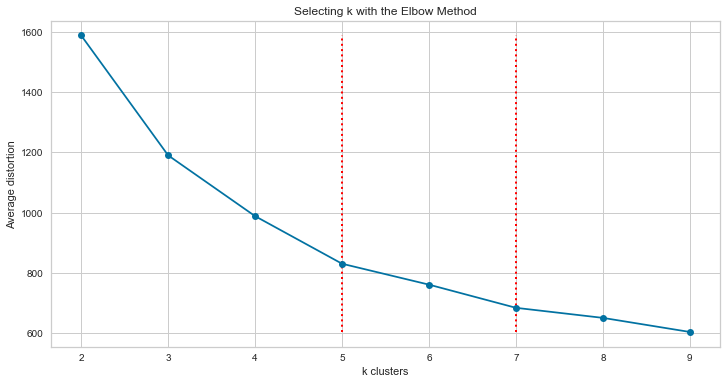

In [41]:
# 3B.......... Plotting vizual and finding elbow

from matplotlib import cm

plt.figure(figsize=(12,6))
plt.plot( clusters_df.k, clusters_df.cluster_errors, marker = "o" )
plt.xlabel('k clusters')
plt.ylabel('Average distortion')
plt.vlines(x=5, ymin=min(clusters_df.cluster_errors), ymax=max(clusters_df.cluster_errors), colors='red', ls=':', lw=2, label='vline_single - full height')
plt.vlines(x=7, ymin=min(clusters_df.cluster_errors), ymax=max(clusters_df.cluster_errors), colors='red', ls=':', lw=2, label='vline_single - full height')
plt.title('Selecting k with the Elbow Method')

In [293]:
!pip install yellowbrick

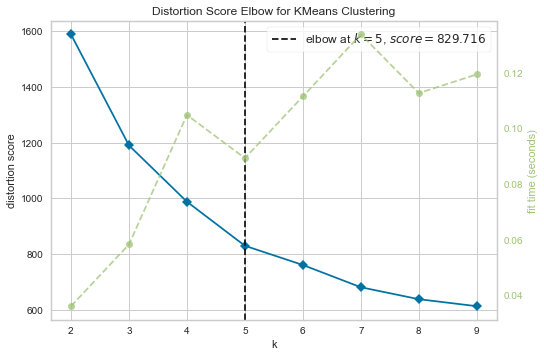

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [42]:
from yellowbrick.cluster import KElbowVisualizer

visualizer = KElbowVisualizer(clusters, k=(2,10))
 
visualizer.fit(Car_Scaled)        # Fit the data to the visualizer
visualizer.show()                # Finalize and render the figure

In [ ]:
# 3C....... K at 5 & 7 looks like a good elbow point....... So 5 & 7 Clusters could be a good option

In [47]:
# 3D...... Training with the optimal number of clusters - 5

kmeans = KMeans(n_clusters=5, n_init = 5, random_state=1)
kmeans.fit(Car_Scaled)

KMeans(n_clusters=5, n_init=5, random_state=1)

In [48]:
# Check the number of data in each cluster ............ checking with 5 clusters 

labels = kmeans.labels_
counts = np.bincount(labels[labels>=0])
print(counts)

[81 94 67 72 84]


In [49]:
# Distribution looks fine.............................. checking with 5 clusters

# let us check the centers in each group
centroids = kmeans.cluster_centers_
centroid_df = pd.DataFrame(centroids, columns = list(Car_Scaled) )
centroid_df.transpose()

,0,1,2,3,4
mpg,-0.564892,-1.163797,0.675937,1.360839,0.141488
cyl,0.451742,1.498191,-0.742109,-0.807268,-0.828291
disp,0.384281,1.503923,-0.584400,-0.901663,-0.814535
hp,-0.063427,1.521683,-0.561587,-0.823297,-0.488058
wt,0.387993,1.404098,-0.480763,-0.963144,-0.736371
acc,0.386319,-1.086149,0.356240,0.423579,0.195719
yr,-0.082954,-0.688324,0.991501,0.922458,-0.731260
origin,-0.668909,-0.715145,-0.621983,1.486835,0.666976


In [50]:
pred=kmeans.predict(Car_Scaled)

In [51]:
pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 0, 0, 0, 4, 4, 4, 4,
       4, 4, 0, 1, 1, 1, 1, 4, 4, 4, 4, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 4, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 4, 1, 1, 1, 1, 0, 4, 4,
       4, 4, 4, 0, 4, 1, 1, 4, 4, 4, 4, 1, 4, 4, 1, 0, 0, 0, 0, 3, 4, 3,
       4, 0, 0, 0, 1, 1, 1, 1, 1, 4, 4, 4, 3, 3, 4, 4, 4, 4, 4, 4, 0, 0,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 4, 2, 0, 2, 4, 4, 4, 0, 4,
       0, 4, 4, 4, 4, 3, 4, 4, 2, 2, 4, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 4,
       3, 0, 0, 0, 0, 4, 3, 3, 2, 4, 1, 4, 4, 0, 1, 1, 1, 1, 3, 2, 3, 2,
       3, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 4, 2, 3, 2, 2, 2, 3, 4, 4,
       4, 4, 3, 2, 3, 3, 3, 0, 1, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 2, 3, 3, 2, 4, 2, 2, 3, 4, 0, 4, 0, 3, 3, 0, 0, 2, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 3, 3, 2, 2, 2, 0, 2, 0,

In [52]:
# 3E.......Appending the prediction ......Adding the new feature which will have labels based upon cluster value

Car_final["Category"] = pred
Car_Scaled["Category"] = pred
print("Categories Assigned : \n")
Car_final

Categories Assigned : 



,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,Category
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,1
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,1
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,1
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,1
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,1
...,...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86.0,2790,15.6,82,1,2
394,vw pickup,44.0,4,97.0,52.0,2130,24.6,82,2,3
395,dodge rampage,32.0,4,135.0,84.0,2295,11.6,82,1,2
396,ford ranger,28.0,4,120.0,79.0,2625,18.6,82,1,2


In [53]:
Car_Clust = Car_final.groupby(['Category'])
Car_Clust.mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin
Category,,,,,,,,
0,19.104938,6.222222,233.444444,101.882716,3298.580247,16.632099,75.703704,1.037037
1,14.429787,8.000000,350.042553,162.393617,4157.978723,12.576596,73.468085,1.000000
2,28.791045,4.194030,132.567164,82.865672,2563.805970,16.549254,79.671642,1.074627
3,34.137500,4.083333,99.527778,72.875000,2155.819444,16.734722,79.416667,2.763889
4,24.619048,4.047619,108.601190,85.672619,2347.619048,16.107143,73.309524,2.107143


In [ ]:
#  Inference for 5 cluster model

1. Cluster 3 has lowest Horse power, lowest weight, lowest displacement, and less cylinders but gives highest Miles per gallon
2. Cluster 1 has highest Horse power, highest weight, heighest displacement and highest cylinders gives lowest miles per gallon
3. Cluster 2 & Cluster 4 are almost similar to Cluster 3 with slight differences in features and gives good miles per gallon
4. Cluster 0 seems to be slightly comparable to Cluster 1 but with slight variations 
    
    

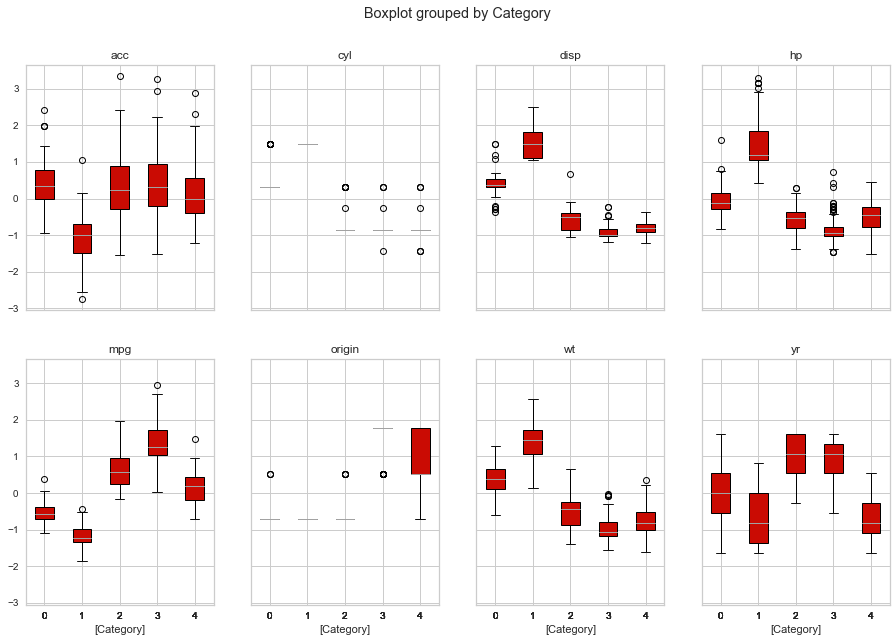

In [54]:
# 3F.........Plot a visual and color the datapoints based upon clusters. 

Car_box = Car_Scaled.boxplot(by='Category', layout = (2,4),figsize=(15,10), patch_artist=True,boxprops=dict(facecolor='r'))

In [55]:
# 3D...... Re-training with the second choice optimal number of clusters - 7

kmeans = KMeans(n_clusters=7, n_init = 5, random_state=1)
kmeans.fit(Car_Scaled)

KMeans(n_clusters=7, n_init=5, random_state=1)

In [56]:
# Check the number of data in each cluster ............ checking with 7 clusters 

labels = kmeans.labels_
counts = np.bincount(labels[labels>=0])
print(counts)

[67 51 41 65 77 47 50]


In [57]:
# Distribution looks fine.............................. checking with 7 clusters

# let us check the centers in each group
centroids = kmeans.cluster_centers_
centroid_df = pd.DataFrame(centroids, columns = list(Car_Scaled) )
centroid_df.transpose()

,0,1,2,3,4,5,6
mpg,0.675937,-1.010372,0.209036,1.467978,-5.577050e-01,-1.291083,0.117526
cyl,-0.742109,1.475108,-0.856321,-0.847265,4.126696e-01,1.498191,-0.750368
disp,-0.584400,1.200186,-0.847594,-0.935244,3.609329e-01,1.776473,-0.755971
hp,-0.561587,1.046531,-0.730894,-0.922789,-1.135962e-01,1.984562,-0.206525
wt,-0.480763,1.217104,-0.855424,-1.023794,3.645660e-01,1.558910,-0.591651
acc,0.356240,-0.748032,0.752798,0.552294,4.218177e-01,-1.385882,-0.396515
yr,0.991501,-0.130149,-0.973582,0.922111,-1.258051e-01,-1.172278,-0.300584
origin,-0.621983,-0.715145,0.167846,1.455093,-6.665071e-01,-0.715145,1.232307
Category,2.000000,0.921569,4.000000,3.000000,-4.440892e-16,1.000000,3.860000


In [58]:
pred=kmeans.predict(Car_Scaled)
pred

array([1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 4, 4, 4, 6, 2, 2, 2,
       2, 6, 4, 5, 5, 5, 5, 6, 2, 6, 2, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5,
       5, 4, 2, 4, 4, 2, 6, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 2, 5, 5, 1, 5,
       1, 5, 5, 5, 5, 6, 1, 1, 1, 1, 6, 2, 2, 2, 2, 6, 6, 2, 6, 5, 1, 1,
       1, 1, 5, 5, 5, 1, 5, 5, 5, 4, 4, 4, 4, 4, 2, 5, 5, 5, 5, 4, 2, 2,
       6, 6, 2, 4, 2, 1, 5, 2, 2, 6, 6, 1, 6, 6, 5, 4, 4, 4, 4, 3, 2, 3,
       2, 4, 4, 4, 1, 1, 1, 1, 1, 2, 2, 6, 3, 3, 2, 2, 6, 6, 6, 2, 4, 4,
       4, 4, 5, 1, 1, 1, 4, 4, 4, 4, 4, 4, 1, 6, 0, 4, 0, 6, 2, 6, 4, 6,
       4, 6, 2, 6, 6, 3, 6, 2, 0, 0, 6, 1, 1, 1, 1, 4, 4, 4, 4, 0, 0, 6,
       3, 4, 4, 4, 4, 6, 3, 3, 0, 6, 1, 2, 6, 4, 1, 1, 1, 1, 3, 0, 3, 0,
       3, 1, 4, 1, 1, 4, 4, 4, 4, 5, 1, 5, 1, 6, 0, 3, 0, 0, 0, 3, 6, 6,
       6, 6, 3, 0, 3, 3, 3, 4, 1, 1, 4, 4, 4, 0, 4, 4, 4, 4, 4, 4, 1, 1,
       1, 1, 0, 6, 6, 0, 6, 0, 0, 6, 6, 4, 6, 4, 3, 3, 4, 4, 0, 4, 4, 1,
       1, 1, 1, 1, 1, 1, 1, 3, 3, 0, 0, 0, 4, 0, 4,

In [59]:
Car_final

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,Category
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,1
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,1
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,1
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,1
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,1
...,...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86.0,2790,15.6,82,1,2
394,vw pickup,44.0,4,97.0,52.0,2130,24.6,82,2,3
395,dodge rampage,32.0,4,135.0,84.0,2295,11.6,82,1,2
396,ford ranger,28.0,4,120.0,79.0,2625,18.6,82,1,2


In [60]:
# Appending the prediction 

Car_final["Category"] = pred
Car_Scaled["Category"] = pred
print("Categories Assigned : \n")
Car_final

Categories Assigned : 



,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,Category
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,1
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,5
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,5
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,5
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,5
...,...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86.0,2790,15.6,82,1,0
394,vw pickup,44.0,4,97.0,52.0,2130,24.6,82,2,3
395,dodge rampage,32.0,4,135.0,84.0,2295,11.6,82,1,0
396,ford ranger,28.0,4,120.0,79.0,2625,18.6,82,1,0


In [61]:
Car_Clust = Car_final.groupby(['Category'])
Car_Clust.mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin
Category,,,,,,,,
0,28.791045,4.194030,132.567164,82.865672,2563.805970,16.549254,79.671642,1.074627
1,15.627451,7.960784,318.411765,144.254902,3999.823529,13.507843,75.529412,1.000000
2,25.146341,4.000000,105.158537,76.402439,2246.926829,17.641463,72.414634,1.707317
3,34.973846,4.015385,96.030769,69.076923,2104.523077,17.089231,79.415385,2.738462
4,19.161039,6.155844,231.012987,99.967532,3278.766234,16.729870,75.545455,1.038961
5,13.436170,8.000000,378.425532,180.063830,4288.914894,11.751064,71.680851,1.000000
6,24.432000,4.180000,114.700000,96.420000,2470.020000,14.476000,74.900000,2.560000


In [ ]:
#  Inference for 7 Cluster model

1. Cluster 3 has lowest Horse power, lowest weight, lowest displacement, and less cylinders but gives highest Miles per gallon
2. Cluster 5 has highest Horse power, highest weight, heighest displacement and highest cylinders gives lowest miles per gallon
3. Cluster 1 is almost similar to Cluster 5 with a very slight difference in all the features
4. Cluster 2 & Cluster 6 are almost similar with slight differences in features
5. Cluster 0 seems to also give a good mileage with lesser number of cylinders, 
    
    

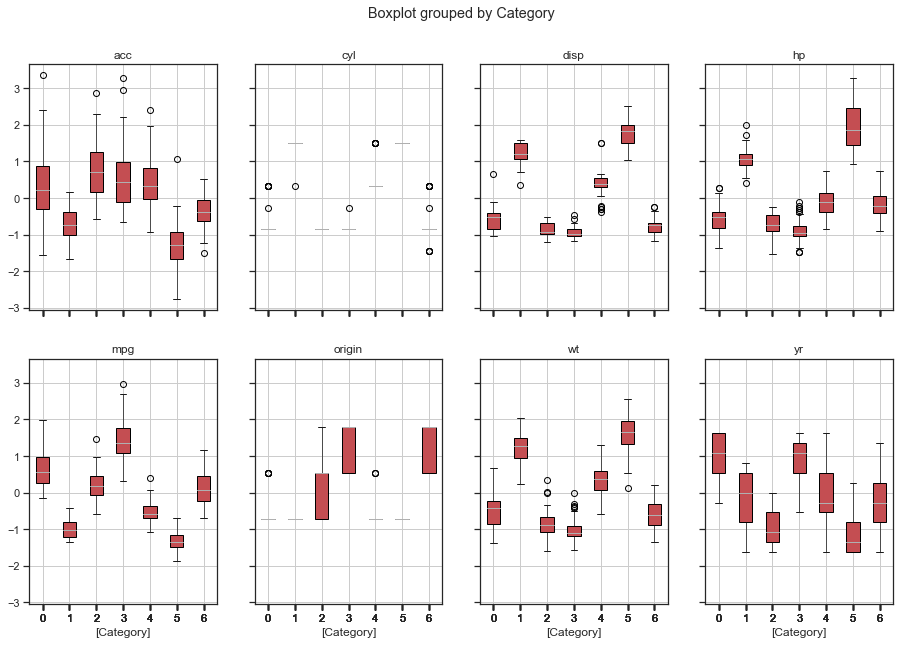

In [87]:
Car_box = Car_Scaled.boxplot(by='Category', layout = (2,4),figsize=(15,10), patch_artist=True,boxprops=dict(facecolor='r'))

In [ ]:
#... 3G...... Passing a new data and finding out to which cluster, it will assign it to...
#............ Pulling out a record for car name = "ford torino" from the existing dataset and creating it as a new data point
#............ This data point was assigned to cluster 5 

In [65]:
New_data = Car_final[Car_final.loc[:,'car_name'] == 'ford torino']

In [66]:
New_data

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,Category
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,5


In [76]:
Car_new = New_data.drop(['car_name'], axis=1)

In [77]:
Car_new

,mpg,cyl,disp,hp,wt,acc,yr,origin,Category
4,17.0,8,302.0,140.0,3449,10.5,70,1,5


In [78]:
New_pred = kmeans.predict(Car_new) 

In [79]:
New_pred  #...... the predict function is rightly predicting the new data has been assigned to Cluster 5

array([5])

In [88]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Use silhouette score to find optimal number of clusters to segment the data

num_clusters = np.arange(2,10)
results = {}
for size in num_clusters:
    model = KMeans(n_clusters = size).fit(Car_Scaled)
    predictions = model.predict(Car_Scaled)
    results[size] = silhouette_score(Car_Scaled, predictions)

best_size = max(results, key=results.get)

In [89]:
results

{2: 0.3365376180833712,
 3: 0.35982189814855536,
 4: 0.4067080893430127,
 5: 0.4429637051916042,
 6: 0.5022359743463826,
 7: 0.5153691119760141,
 8: 0.4864490524283309,
 9: 0.43352894036594447}

In [90]:
best_size

7

In [ ]:
# .. Silhoutte score is another method by which we try to predict the best number of clusters and this has given a size of 7
# .. as the best size.

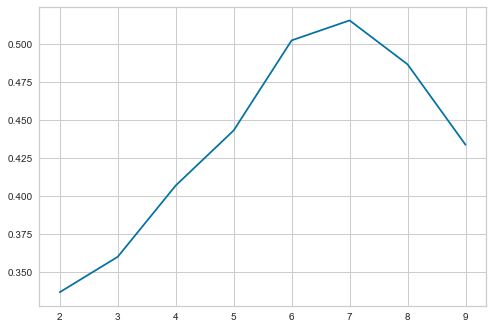

In [304]:
myList = results.items()
myList = sorted(myList) 
x, y = zip(*myList) 

plt.plot(x, y)
plt.show()

# Part B - Domain Automobile

# 1. Data Understanding and Cleaning

In [33]:
#1A... Reading Vehicle csv

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns


In [34]:
Vehicle_df = pd.read_csv("vehicle.csv")

In [35]:
Vehicle_df

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car


In [103]:
Vehicle_df.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [104]:
Vehicle_df.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


In [ ]:
...# 1B.......... Check percentage of missing values

There are totally 846 rows, but some columns seem to be missing a few values hence reporting lesser count

1.  circularity                 = 841 - 5 missing values
2.  distance_circularity        = 842 - 4 missing values
3.  radius_ratio                = 840 - 6 missing values
4.  pr.axis_aspect_ratio        = 844 - 2 missing values
5.  scatter_ratio               = 845 - 1 missing value
6.  elongatedness               = 845 - 1 missing value
7.  pr.axis_rectangular         = 843 - 3 missing values
8.  scaled_variance             = 843 - 3 missing values
9.  scaled_variance1            = 844 - 2 missing values
10. scaled_radius_of_gyration   = 844 - 2 missing values
11. scaled_radius_of_gyration.1 = 842 - 4 misssing values
12. skewness_about              = 840 - 6 missing values
13. skewness_about.1            = 845 - 1 missing value
14. skewness_about.2            = 845 - 1 missing value

while the following non-object columns seems to be having no issues

1. compactness
2. max.length_aspect_ratio
3. max.length_regularity
4. hollows_ratio

This makes it 18 columns out of the 19

In [36]:
Vehicle_df.describe(include=object)

,class
count,846
unique,3
top,car
freq,429


Class column does'nt seem to have any missing values.

In [37]:
Vehicle_df.isnull().any()

compactness                    False
circularity                     True
distance_circularity            True
radius_ratio                    True
pr.axis_aspect_ratio            True
max.length_aspect_ratio        False
scatter_ratio                   True
elongatedness                   True
pr.axis_rectangularity          True
max.length_rectangularity      False
scaled_variance                 True
scaled_variance.1               True
scaled_radius_of_gyration       True
scaled_radius_of_gyration.1     True
skewness_about                  True
skewness_about.1                True
skewness_about.2                True
hollows_ratio                  False
class                          False
dtype: bool

There are 14 columns listed with "True" which matches with our missing values 14 columns listed earlier.

In [38]:
for i in Vehicle_df.columns:
    print("column is",i)
    print("missing values",Vehicle_df[i].isnull().sum())
    

column is compactness
missing values 0
column is circularity
missing values 5
column is distance_circularity
missing values 4
column is radius_ratio
missing values 6
column is pr.axis_aspect_ratio
missing values 2
column is max.length_aspect_ratio
missing values 0
column is scatter_ratio
missing values 1
column is elongatedness
missing values 1
column is pr.axis_rectangularity
missing values 3
column is max.length_rectangularity
missing values 0
column is scaled_variance
missing values 3
column is scaled_variance.1
missing values 2
column is scaled_radius_of_gyration
missing values 2
column is scaled_radius_of_gyration.1
missing values 4
column is skewness_about
missing values 6
column is skewness_about.1
missing values 1
column is skewness_about.2
missing values 1
column is hollows_ratio
missing values 0
column is class
missing values 0


These numbers match my earlier numbers

In [39]:
temp_vehicle = Vehicle_df[Vehicle_df.isna().any(axis=1)]

In [109]:
temp_vehicle

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car
19,101,56.0,100.0,215.0,NaN,10,208.0,32.0,24.0,169,227.0,651.0,223.0,74.0,6.0,5.0,186.0,193,car
35,100,46.0,NaN,172.0,67.0,9,157.0,43.0,20.0,150,170.0,363.0,184.0,67.0,17.0,7.0,192.0,200,van
66,81,43.0,68.0,125.0,57.0,8,149.0,46.0,19.0,146,169.0,323.0,172.0,NaN,NaN,18.0,179.0,184,bus
70,96,55.0,98.0,161.0,54.0,10,215.0,31.0,NaN,175,226.0,683.0,221.0,76.0,3.0,6.0,185.0,193,car
77,86,40.0,62.0,140.0,62.0,7,150.0,45.0,19.0,133,165.0,330.0,173.0,NaN,2.0,3.0,180.0,185,car
78,104,52.0,94.0,NaN,66.0,5,208.0,31.0,24.0,161,227.0,666.0,218.0,76.0,11.0,4.0,193.0,191,bus
105,108,NaN,103.0,202.0,64.0,10,220.0,30.0,25.0,168,NaN,711.0,214.0,73.0,11.0,NaN,188.0,199,car
118,85,NaN,NaN,128.0,56.0,8,150.0,46.0,19.0,144,168.0,324.0,173.0,82.0,9.0,14.0,180.0,184,bus


In [40]:
...# 1B.......... Check percentage of missing values

percent_missing = Vehicle_df.isnull().sum() * 100 / len(Vehicle_df)
missing_value_df = pd.DataFrame({'column_name': Vehicle_df.columns,
                                 'percent_missing': percent_missing})

In [41]:
missing_value_df

,column_name,percent_missing
compactness,compactness,0.000000
circularity,circularity,0.591017
distance_circularity,distance_circularity,0.472813
radius_ratio,radius_ratio,0.709220
pr.axis_aspect_ratio,pr.axis_aspect_ratio,0.236407
max.length_aspect_ratio,max.length_aspect_ratio,0.000000
scatter_ratio,scatter_ratio,0.118203
elongatedness,elongatedness,0.118203
pr.axis_rectangularity,pr.axis_rectangularity,0.354610
max.length_rectangularity,max.length_rectangularity,0.000000


In [42]:
for i in Vehicle_df.columns:
    if ( Vehicle_df[i].isnull().sum() > 0):
        median = Vehicle_df[i].median()
        Vehicle_df[i].fillna(median, inplace=True)   #..... Imputing with median
    

In [43]:
Vehicle_df.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.823877,82.100473,168.874704,61.677305,8.567376,168.887707,40.936170,20.580378,147.998818,188.596927,439.314421,174.706856,72.443262,6.361702,12.600473,188.918440,195.632388
std,8.234474,6.134272,15.741569,33.401356,7.882188,4.601217,33.197710,7.811882,2.588558,14.515652,31.360427,176.496341,32.546277,7.468734,4.903244,8.930962,6.152247,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.250000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,586.750000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


In [44]:
Vehicle_df.groupby('class')

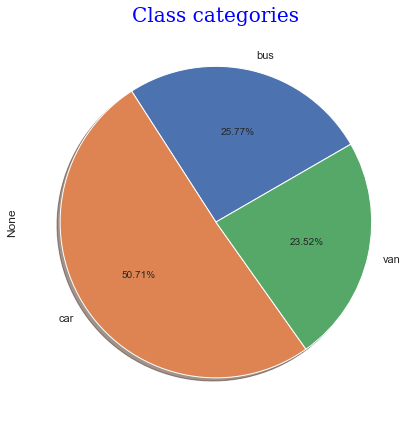

In [47]:
#1C... Visualize a pie chart for "Class"

Vehicle_df.groupby('class').size().plot(kind='pie', subplots=True, shadow=True, startangle=30, figsize=(8,6), autopct='%1.2f%%')
font1 = {'family':'serif','color':'blue','size':20}
plt.title("Class categories", fontdict = font1)    
                
plt.tight_layout()
plt.show()


<AxesSubplot:>

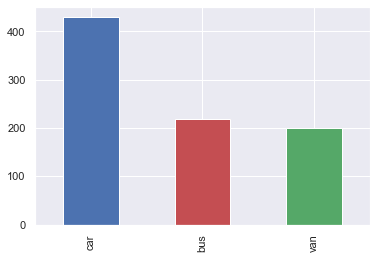

In [46]:
from itertools import cycle, islice

my_colors = list(islice(cycle(['b', 'r', 'g', 'y', 'k']), None, len(Vehicle_df['class'])))

pd.value_counts(Vehicle_df["class"]).plot(kind="bar",color=my_colors)

In [48]:
#...1D......... checking for duplicated rows

Vehicle_df.duplicated().sum()

0

In [49]:
duplicate = Vehicle_df[Vehicle_df.duplicated()]

In [23]:
duplicate

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class


There are no duplicate rows in the dataset.

# 2.... Data Preparation 

In [50]:
#2A.... Splitting data into X & Y

X = Vehicle_df.drop(["class"], axis=1)   #........... Independent variables, 
y = Vehicle_df['class']                  #.............. Dependent variable

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.20, random_state=1)

In [51]:
X_train

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
135,89,47.0,83.0,322.0,133.0,48,158.0,43.0,20.0,163,229.0,364.0,176.0,97.0,0.0,14.0,184.0,194
223,81,44.0,72.0,139.0,60.0,6,153.0,44.0,19.0,146,180.0,347.0,178.0,81.0,1.0,15.0,182.0,186
388,94,47.0,85.0,333.0,138.0,49,155.0,43.0,19.0,155,320.0,354.0,187.0,135.0,12.0,9.0,188.0,196
134,102,54.0,100.0,163.0,53.0,10,213.0,31.0,24.0,173,219.0,669.0,201.0,76.0,12.0,27.0,187.0,195
619,97,55.0,96.0,170.0,54.0,10,216.0,31.0,24.0,173,219.0,685.0,218.0,75.0,0.0,4.0,184.0,193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,100,52.0,109.0,225.0,68.0,10,222.0,30.0,25.0,165,241.0,731.0,207.0,73.0,7.0,28.0,188.0,199
767,88,39.0,70.0,166.0,66.0,7,148.0,44.0,19.0,134,167.0,332.0,143.0,69.0,5.0,13.0,193.0,201
72,92,39.0,91.0,191.0,62.0,8,176.0,37.0,21.0,137,196.0,466.0,151.0,67.0,3.0,23.0,192.0,200
235,90,48.0,78.0,134.0,56.0,11,160.0,43.0,20.0,167,169.0,366.0,185.0,76.0,1.0,14.0,182.0,192


In [52]:
y_train

135    van
223    bus
388    van
134    car
619    car
      ... 
715    car
767    bus
72     car
235    van
37     van
Name: class, Length: 676, dtype: object

In [53]:
y.unique()

array(['van', 'car', 'bus'], dtype=object)

In [54]:
from scipy.stats import zscore

X_z = X.apply(zscore)

In [55]:
X_z

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,-0.224342,0.758332,-0.401920,-0.341934,0.285705,-0.327326,-0.073812,0.380870,-0.312012,0.183957
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.610886,-0.344578,-0.593357,-0.619724,-0.513630,-0.059384,0.538390,0.156798,0.013265,0.452977
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.935290,0.689401,1.097671,1.109379,1.392477,0.074587,1.558727,-0.403383,-0.149374,0.049447
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.610886,-0.344578,-0.912419,-0.738777,-1.466683,-1.265121,-0.073812,-0.291347,1.639649,1.529056
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.610886,-0.275646,1.671982,-0.648070,0.408680,7.309005,0.538390,-0.179311,-1.450481,-1.699181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,-0.082445,-0.949961,0.311432,0.423146,0.294851,-0.123383,0.003385,-0.119910,-0.224342,-0.964965,0.363829,-0.098159,-0.790323,-0.059384,0.130256,1.389197,-0.149374,-0.085062
842,-0.568495,0.191843,0.120741,-0.175986,0.548738,0.529004,-0.298019,0.264347,-0.224342,0.758332,-0.497638,-0.404295,0.039756,-0.059384,-1.094148,0.829015,-0.474650,0.183957
843,1.497218,1.496763,1.201323,1.591454,0.675681,0.746467,1.600825,-1.400769,1.708378,1.723379,1.257202,1.596929,0.777604,-0.327326,-0.686013,-0.963565,-0.312012,0.721997
844,-0.933032,-1.439306,-0.260641,-0.685249,-0.466810,-0.340845,-1.021388,1.160948,-0.997430,-1.654284,-1.071950,-0.959876,-0.821066,-0.863208,-1.298215,1.389197,0.175903,-0.085062


In [56]:
X_train, X_test, y_train, y_test = train_test_split(X_z, y, test_size=.20, random_state=1)

In [57]:
#2B.... Standardizing the data

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [58]:
X_train

array([[-0.58186122,  0.342899  ,  0.04235553, ...,  0.16001899,
        -0.7979766 , -0.21617737],
       [-1.55067449, -0.14820211, -0.6498549 , ...,  0.27062517,
        -1.12530195, -1.28091983],
       [ 0.02364707,  0.342899  ,  0.16821198, ..., -0.39301188,
        -0.14332589,  0.05000824],
       ...,
       [-0.21855625, -0.96670396,  0.5457813 , ...,  1.15547456,
         0.51132481,  0.58237947],
       [-0.46075956,  0.50659937, -0.27228557, ...,  0.16001899,
        -1.12530195, -0.48236299],
       [-0.46075956,  0.50659937,  0.2311402 , ...,  0.27062517,
        -0.63431392, -0.21617737]])

# 3. Model Building

In [59]:
#.... 3A........ Train a base classification model using SVM

from sklearn.svm import SVC  

clf = SVC(kernel='linear') 
  
# fitting x samples and y classes 
clf.fit(X_train, y_train) 

SVC(kernel='linear')

In [60]:
clf.score(X_train,y_train)

0.9585798816568047

In [61]:
y_pred_svm = clf.predict(X_test)

<AxesSubplot:>

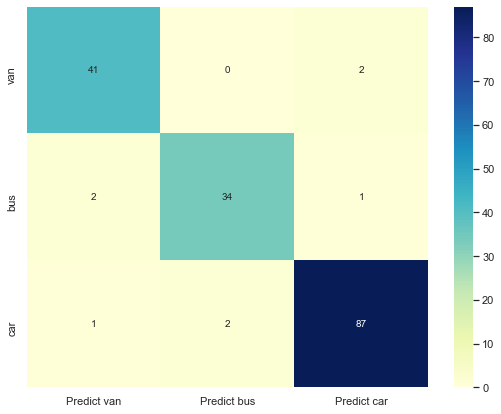

In [62]:
from sklearn import metrics

from sklearn.metrics import roc_auc_score

cm=metrics.confusion_matrix(y_test, y_pred_svm, labels=['van','bus','car'])

df_cm = pd.DataFrame(cm, index = [i for i in ["van","bus","car"]],
                  columns = [i for i in ["Predict van","Predict bus","Predict car"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

In [63]:
clf.score(X_test,y_test)

0.9529411764705882

In [64]:
y_pred_svm

array(['van', 'bus', 'bus', 'bus', 'car', 'car', 'van', 'van', 'van',
       'van', 'van', 'van', 'bus', 'car', 'bus', 'bus', 'van', 'car',
       'car', 'bus', 'car', 'car', 'car', 'car', 'van', 'van', 'bus',
       'car', 'car', 'car', 'car', 'van', 'car', 'car', 'van', 'car',
       'bus', 'car', 'bus', 'bus', 'car', 'van', 'van', 'car', 'van',
       'van', 'car', 'car', 'car', 'car', 'car', 'car', 'bus', 'car',
       'car', 'van', 'car', 'car', 'van', 'bus', 'car', 'van', 'car',
       'van', 'bus', 'car', 'car', 'car', 'car', 'bus', 'car', 'van',
       'car', 'van', 'bus', 'car', 'car', 'car', 'van', 'car', 'car',
       'van', 'car', 'car', 'bus', 'car', 'van', 'car', 'bus', 'bus',
       'car', 'bus', 'van', 'van', 'van', 'van', 'bus', 'bus', 'bus',
       'car', 'car', 'car', 'car', 'van', 'van', 'car', 'car', 'car',
       'car', 'car', 'car', 'bus', 'car', 'car', 'car', 'van', 'car',
       'van', 'van', 'car', 'car', 'van', 'car', 'car', 'car', 'car',
       'van', 'car',

In [65]:
#...... 3B....... Printing classification metrics for training data

print("SVC - Accuracy ",metrics.accuracy_score(y_test, y_pred_svm))
print("SVC - Precision",metrics.precision_score(y_test, y_pred_svm, average="weighted"))
print("SVC - Recall   ",metrics.recall_score(y_test, y_pred_svm, average="weighted"))
print("SVC - F1 Score ",metrics.f1_score(y_test, y_pred_svm, average="weighted"))


SVC - Accuracy  0.9529411764705882
SVC - Precision 0.9530154486036839
SVC - Recall    0.9529411764705882
SVC - F1 Score  0.9529087591578909


In [66]:
Vehicle_df.cov() #.... checking covariance of the dataset against each column.

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,67.806566,34.595378,102.393288,189.708781,5.941097,5.616954,222.142552,-50.737706,17.344216,80.818554,196.794514,1183.048547,156.845875,-15.350216,9.531814,11.547134,15.124042,22.391727
circularity,34.595378,37.629299,76.508841,127.220510,7.435406,7.097679,172.677241,-39.365101,13.392280,85.598608,153.188097,905.058993,184.837067,2.379936,4.337152,-0.626662,-3.941009,2.115060
distance_circularity,102.393288,76.508841,247.796994,403.298994,19.660863,19.171329,472.978160,-112.064585,36.388956,176.978817,425.299717,2461.647662,361.587476,-26.564115,8.793202,37.332497,14.149033,38.962423
radius_ratio,189.708781,127.220510,403.298994,1115.650555,174.669579,69.167032,814.370529,-205.997356,61.247953,275.850739,831.086715,4235.335892,583.084529,-45.002975,7.977918,51.827988,78.542431,117.104181
pr.axis_aspect_ratio,5.941097,7.435406,19.660863,174.669579,62.128881,23.527685,27.143602,-11.270326,1.624193,14.520328,67.460309,124.077322,31.289907,9.004155,-2.255923,-2.250972,11.632821,15.697801
max.length_aspect_ratio,5.616954,7.097679,19.171329,69.167032,23.527685,21.171195,25.385681,-6.474984,1.923572,20.433808,46.024231,116.335595,28.414449,10.162999,0.351933,1.784347,-0.738285,4.925981
scatter_ratio,222.142552,172.677241,472.978160,814.370529,27.143602,25.385681,1102.087967,-251.971673,85.053415,389.886258,987.646992,5818.327065,864.233907,-6.828864,12.119955,62.982302,1.149410,29.342103
elongatedness,-50.737706,-39.365101,-112.064585,-205.997356,-11.270326,-6.474984,-251.971673,61.025507,-19.190130,-87.977590,-229.398540,-1315.091741,-194.833526,6.027143,-2.014755,-12.910739,-5.533023,-12.604557
pr.axis_rectangularity,17.344216,13.392280,36.388956,61.247953,1.624193,1.923572,85.053415,-19.190130,6.700632,30.470509,75.838946,451.485940,67.119448,-0.299576,1.063200,4.963512,-0.296987,1.911832
max.length_rectangularity,80.818554,85.598608,176.978817,275.850739,14.520328,20.433808,389.886258,-87.977590,30.470509,210.704141,339.129701,2035.770195,409.337523,4.512359,9.669067,0.177042,-9.282937,8.289506


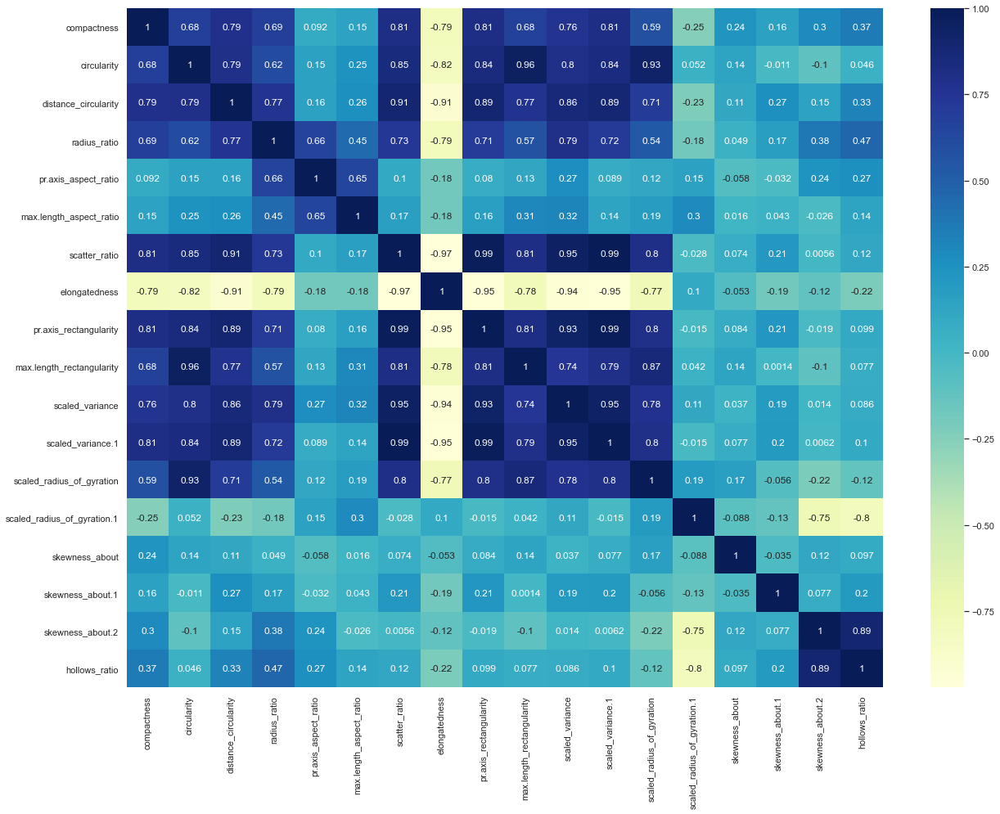

In [67]:
# Check for correlation of variable

sns.set(rc={'figure.figsize':(20.7,15.27)})

sns.heatmap(Vehicle_df.corr(method='pearson'),annot=True,cmap="YlGnBu");


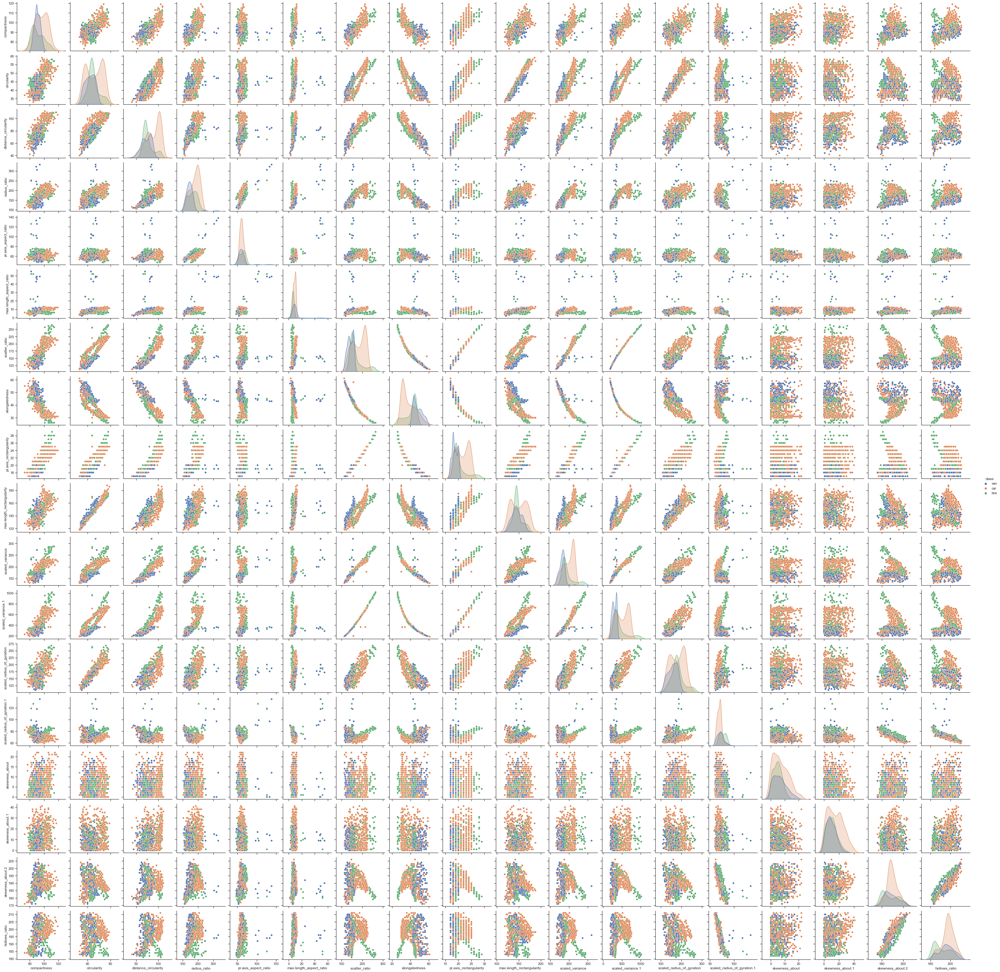

In [25]:
sns.set(rc={'figure.figsize':(18.7,1200.27)})

sns. set(style="ticks", color_codes=True)

sns.pairplot(Vehicle_df, hue='class');


In [176]:
Vehicle_df.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.823877,82.100473,168.874704,61.677305,8.567376,168.887707,40.936170,20.580378,147.998818,188.596927,439.314421,174.706856,72.443262,6.361702,12.600473,188.918440,195.632388
std,8.234474,6.134272,15.741569,33.401356,7.882188,4.601217,33.197710,7.811882,2.588558,14.515652,31.360427,176.496341,32.546277,7.468734,4.903244,8.930962,6.152247,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.250000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,586.750000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


<AxesSubplot:>

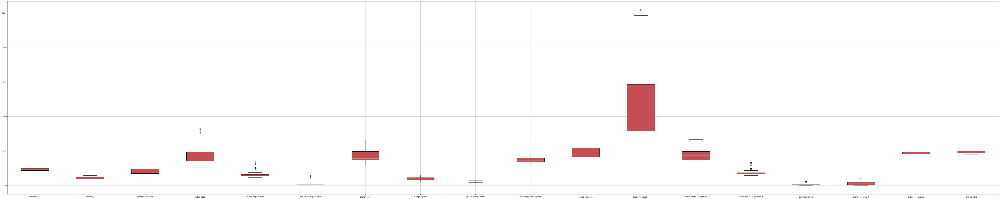

In [26]:
Vehicle_df.boxplot(figsize=(100,20),patch_artist=True,boxprops=dict(facecolor='r'))

column is compactness


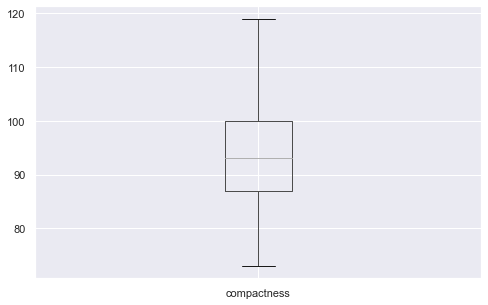

column is circularity


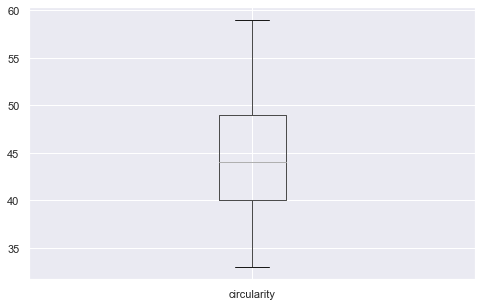

column is distance_circularity


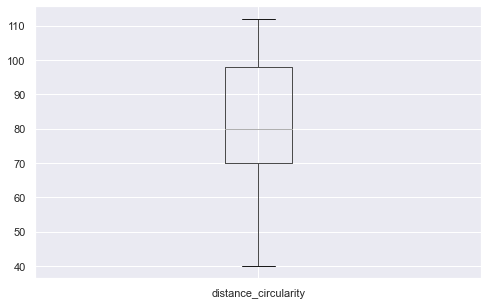

column is radius_ratio


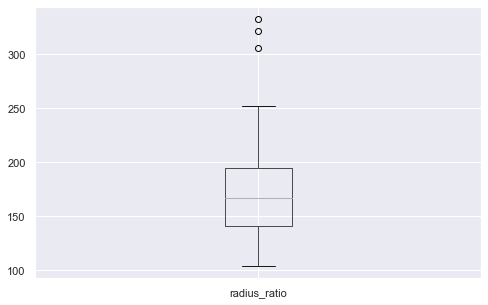

column is pr.axis_aspect_ratio


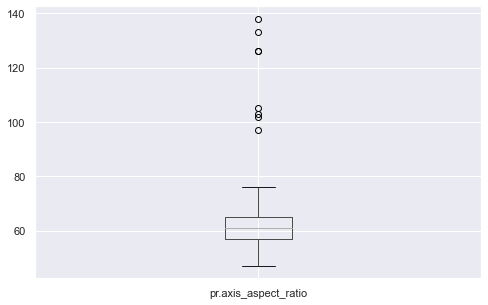

column is max.length_aspect_ratio


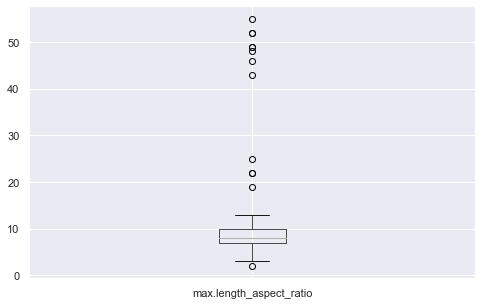

column is scatter_ratio


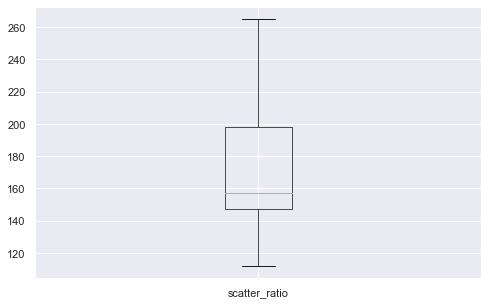

column is elongatedness


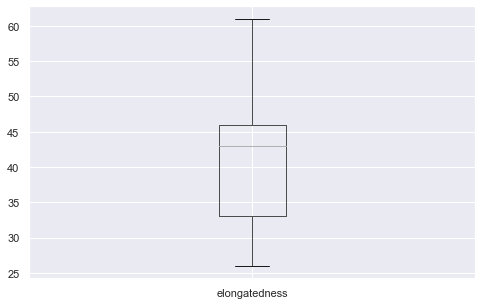

column is pr.axis_rectangularity


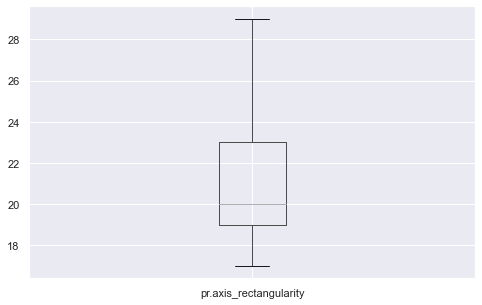

column is max.length_rectangularity


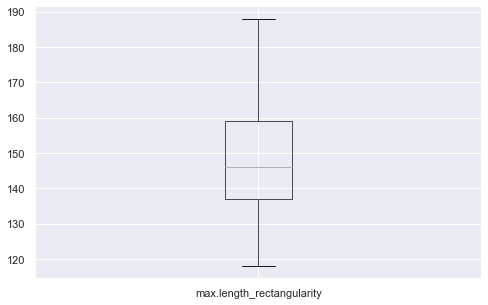

column is scaled_variance


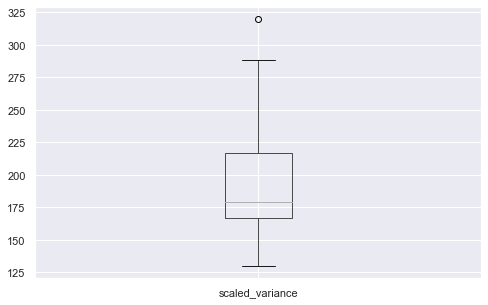

column is scaled_variance.1


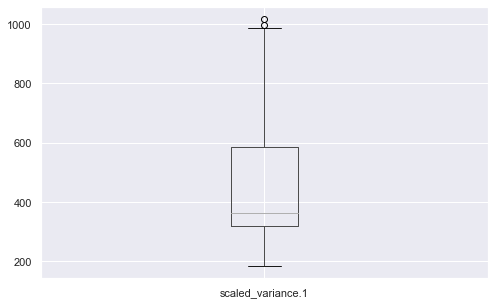

column is scaled_radius_of_gyration


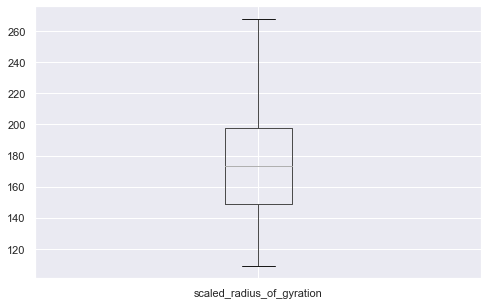

column is scaled_radius_of_gyration.1


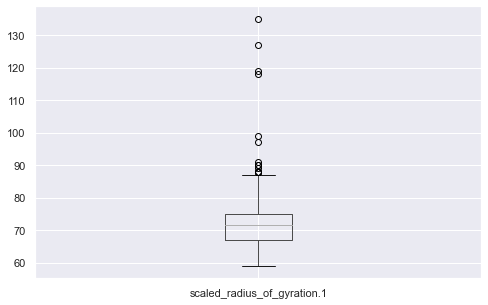

column is skewness_about


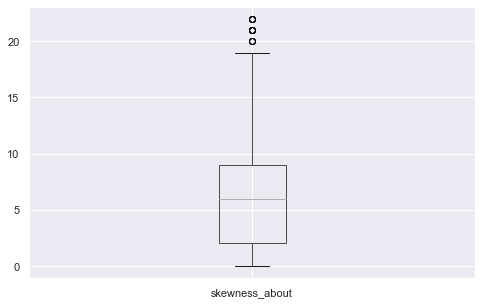

column is skewness_about.1


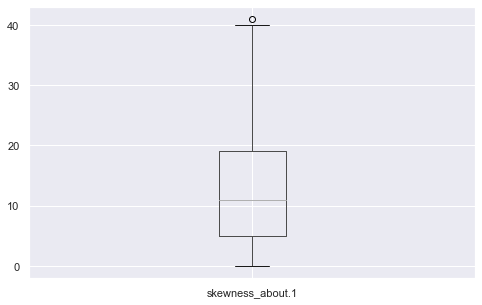

column is skewness_about.2


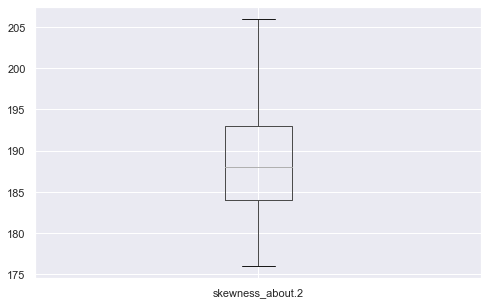

column is hollows_ratio


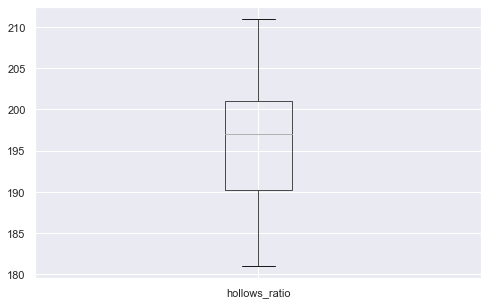

In [68]:
sns.set(rc={'figure.figsize':(8,5)})

for column in Vehicle_df:
    if column == 'class':
        print("")
    else:
        print("column is",column)
        plt.figure()
        Vehicle_df.boxplot([column])
        plt.show()


The following features have outliers

1. radius_ratio - small outliers
2. pr.axis_aspect_ratio - lot of outliers
3. max.length_aspect_ratio - too much of outliers
4. scaled_variance - small outliers
5. scaled_variance.1 - small outliers
6. scaled_radius_of_gyration.1 - lots of outliers
7. skewness_about - few outlier
8. skewness_about.1 - 1 outlier

In [69]:
# Drop class variable
Vehicle_new = Vehicle_df.drop(['class'], axis =1)

Vehicle_new.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183


In [70]:
Vehicle_new=Vehicle_new.apply(zscore)
Vehicle_new.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,-0.224342,0.758332,-0.401920,-0.341934,0.285705,-0.327326,-0.073812,0.380870,-0.312012,0.183957
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.610886,-0.344578,-0.593357,-0.619724,-0.513630,-0.059384,0.538390,0.156798,0.013265,0.452977
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.935290,0.689401,1.097671,1.109379,1.392477,0.074587,1.558727,-0.403383,-0.149374,0.049447
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.610886,-0.344578,-0.912419,-0.738777,-1.466683,-1.265121,-0.073812,-0.291347,1.639649,1.529056
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.610886,-0.275646,1.671982,-0.648070,0.408680,7.309005,0.538390,-0.179311,-1.450481,-1.699181


In [71]:
#..... 3C....... Applying PCA with 10 components.

# Using scikit learn PCA here. It does all the above steps and maps data to PCA dimensions in one shot
from sklearn.decomposition import PCA

# NOTE - we are generating only 10 PCA dimensions (dimensionality reduction from 18 to 10)

pca = PCA(n_components=10)
pca.fit(Vehicle_new)

PCA(n_components=10)

In [72]:
print(pca.explained_variance_)

[9.40460261 3.01492206 1.90352502 1.17993747 0.91726063 0.53999263
 0.35887012 0.22193246 0.1606086  0.09185722]


In [73]:
pca.components_

array([[ 2.75283688e-01,  2.93258469e-01,  3.04609128e-01,
         2.67606877e-01,  8.05039890e-02,  9.72756855e-02,
         3.17092750e-01, -3.14133155e-01,  3.13959064e-01,
         2.82830900e-01,  3.09280359e-01,  3.13788457e-01,
         2.72047492e-01, -2.08137692e-02,  4.14555082e-02,
         5.82250207e-02,  3.02795063e-02,  7.41453913e-02],
       [-1.26953763e-01,  1.25576727e-01, -7.29516436e-02,
        -1.89634378e-01, -1.22174860e-01,  1.07482875e-02,
         4.81181371e-02,  1.27498515e-02,  5.99352482e-02,
         1.16220532e-01,  6.22806229e-02,  5.37843596e-02,
         2.09233172e-01,  4.88525148e-01, -5.50899716e-02,
        -1.24085090e-01, -5.40914775e-01, -5.40354258e-01],
       [-1.19922479e-01, -2.48205467e-02, -5.60143254e-02,
         2.75074211e-01,  6.42012966e-01,  5.91801304e-01,
        -9.76283108e-02,  5.76484384e-02, -1.09512416e-01,
        -1.70641987e-02,  5.63239801e-02, -1.08840729e-01,
        -3.14636493e-02,  2.86277015e-01, -1.15679354e

In [74]:
print(pca.explained_variance_ratio_)

[0.52186034 0.16729768 0.10562639 0.0654746  0.05089869 0.02996413
 0.01991366 0.01231501 0.00891215 0.00509715]


In [75]:
Xpca10 = pca.transform(Vehicle_new)

In [76]:
Xpca10

array([[ 3.34162030e-01, -2.19026358e-01,  1.00158417e+00, ...,
        -3.81106357e-01, -8.66309530e-01,  9.15114442e-02],
       [-1.59171085e+00, -4.20602982e-01, -3.69033854e-01, ...,
         2.47058909e-01,  1.47249715e-01, -9.37944293e-02],
       [ 3.76932418e+00,  1.95282752e-01,  8.78587404e-02, ...,
         4.82771767e-01, -3.10832555e-01, -4.67615341e-01],
       ...,
       [ 4.80917387e+00, -1.24931049e-03,  5.32333105e-01, ...,
         1.10477865e-01, -6.52536352e-01,  5.56591558e-01],
       [-3.29409242e+00, -1.00827615e+00, -3.57003198e-01, ...,
         3.20621635e-01, -2.01263247e-01, -8.74536682e-01],
       [-4.76505347e+00,  3.34899728e-01, -5.68136078e-01, ...,
        -2.48034955e-01, -4.29903644e-01, -2.99232676e-01]])

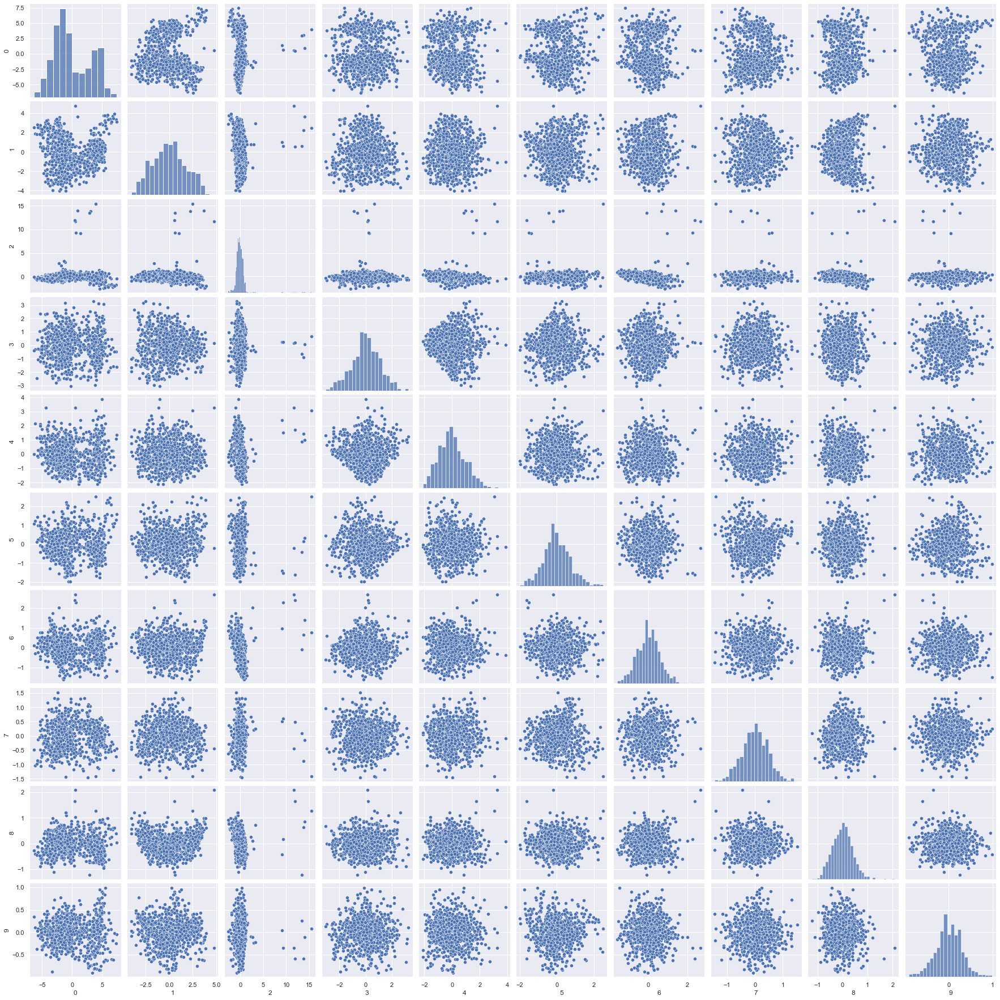

In [77]:
sns.pairplot(pd.DataFrame(Xpca10))

In [78]:
X_train_1a, X_test_1a, y_train_1a, y_test_1a = train_test_split(Xpca10, y, test_size=.20, random_state=1)

In [79]:
X_train_1a = scaler.fit_transform(X_train_1a)

X_test_1a = scaler.transform(X_test_1a)

clf10 = SVC(kernel='linear') 
  
# fitting x samples and y classes 
clf10.fit(X_train_1a, y_train_1a) 
print("Train score with PCA 10 features",clf10.score(X_train_1a,y_train_1a))
y_pred_svm_1a = clf10.predict(X_test_1a)
print("Test score with PCA 10 features",clf10.score(X_test_1a,y_test_1a))
print("Predicted Y with PCA 10 features",y_pred_svm_1a)

print("SVC with PCA 10 features - Accuracy ",metrics.accuracy_score(y_test_1a, y_pred_svm_1a))
print("SVC with PCA 10 features - Precision",metrics.precision_score(y_test_1a, y_pred_svm_1a, average="weighted"))
print("SVC with PCA 10 features - Recall   ",metrics.recall_score(y_test_1a, y_pred_svm_1a, average="weighted"))
print("SVC with PCA 10 features - F1 Score ",metrics.f1_score(y_test_1a, y_pred_svm_1a, average="weighted"))


Train score with PCA 10 features 0.9186390532544378
Test score with PCA 10 features 0.9176470588235294
Predicted Y with PCA 10 features ['van' 'bus' 'bus' 'bus' 'car' 'car' 'van' 'van' 'van' 'van' 'van' 'van'
 'car' 'bus' 'bus' 'car' 'van' 'car' 'van' 'bus' 'car' 'car' 'car' 'car'
 'van' 'van' 'bus' 'car' 'car' 'car' 'car' 'van' 'car' 'car' 'van' 'car'
 'bus' 'car' 'bus' 'bus' 'car' 'van' 'van' 'car' 'van' 'van' 'car' 'bus'
 'car' 'car' 'car' 'car' 'bus' 'car' 'car' 'van' 'car' 'car' 'van' 'bus'
 'car' 'van' 'car' 'van' 'bus' 'car' 'car' 'car' 'car' 'bus' 'car' 'van'
 'car' 'van' 'bus' 'car' 'bus' 'car' 'van' 'car' 'car' 'van' 'car' 'car'
 'bus' 'car' 'van' 'car' 'bus' 'bus' 'car' 'bus' 'van' 'bus' 'van' 'van'
 'bus' 'bus' 'bus' 'car' 'car' 'car' 'car' 'van' 'van' 'car' 'car' 'car'
 'car' 'car' 'car' 'bus' 'car' 'car' 'car' 'van' 'car' 'van' 'van' 'car'
 'car' 'van' 'car' 'car' 'bus' 'car' 'van' 'car' 'van' 'car' 'car' 'car'
 'car' 'car' 'car' 'bus' 'bus' 'car' 'car' 'bus' 'car' 'van' 

In [80]:
list(range(1,11))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

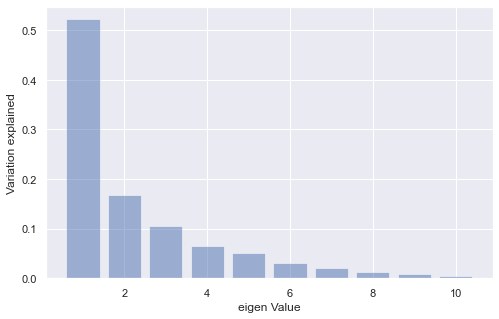

In [81]:
plt.bar(list(range(1,11)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

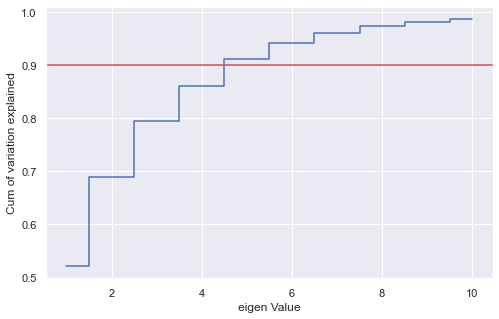

In [82]:
#....3D........ Visualizing cumulative variance explained and drawing a horizontal line at 90%

plt.step(list(range(1,11)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.axhline(y = 0.9, color = 'r', linestyle = '-')
plt.show()

In [235]:
# Dimensionality Reduction

#Now 5 dimensions seems very reasonable. With 5 variables we can explain over 90% of the variation in the original data!


In [83]:
#..... 3F......... Applying PCA on 5 components

pca5 = PCA(n_components=5)
pca5.fit(Vehicle_new)
print(pca5.components_)
print(pca5.explained_variance_ratio_)
Xpca5 = pca5.transform(Vehicle_new)

[[ 2.75283688e-01  2.93258469e-01  3.04609128e-01  2.67606877e-01
   8.05039890e-02  9.72756855e-02  3.17092750e-01 -3.14133155e-01
   3.13959064e-01  2.82830900e-01  3.09280359e-01  3.13788457e-01
   2.72047492e-01 -2.08137692e-02  4.14555082e-02  5.82250207e-02
   3.02795063e-02  7.41453913e-02]
 [-1.26953763e-01  1.25576727e-01 -7.29516436e-02 -1.89634378e-01
  -1.22174860e-01  1.07482875e-02  4.81181371e-02  1.27498515e-02
   5.99352482e-02  1.16220532e-01  6.22806229e-02  5.37843596e-02
   2.09233172e-01  4.88525148e-01 -5.50899716e-02 -1.24085090e-01
  -5.40914775e-01 -5.40354258e-01]
 [-1.19922479e-01 -2.48205467e-02 -5.60143254e-02  2.75074210e-01
   6.42012966e-01  5.91801304e-01 -9.76283108e-02  5.76484384e-02
  -1.09512416e-01 -1.70641987e-02  5.63239801e-02 -1.08840729e-01
  -3.14636493e-02  2.86277015e-01 -1.15679354e-01 -7.52828901e-02
   8.73592033e-03  3.95242743e-02]
 [ 7.83843562e-02  1.87337408e-01 -7.12008427e-02 -4.26053417e-02
   3.27257121e-02  3.14147276e-02 -9.

In [84]:
Xpca5

array([[ 3.34162030e-01, -2.19026358e-01,  1.00158417e+00,
         1.76612370e-01,  7.93007081e-02],
       [-1.59171085e+00, -4.20602982e-01, -3.69033854e-01,
         2.33234117e-01,  6.93948582e-01],
       [ 3.76932418e+00,  1.95282752e-01,  8.78587404e-02,
         1.20221219e+00,  7.31732265e-01],
       ...,
       [ 4.80917387e+00, -1.24931049e-03,  5.32333105e-01,
         2.95652324e-01, -1.34423635e+00],
       [-3.29409242e+00, -1.00827615e+00, -3.57003198e-01,
        -1.93367514e+00,  4.27680050e-02],
       [-4.76505347e+00,  3.34899728e-01, -5.68136078e-01,
        -1.22480708e+00, -5.40510368e-02]])

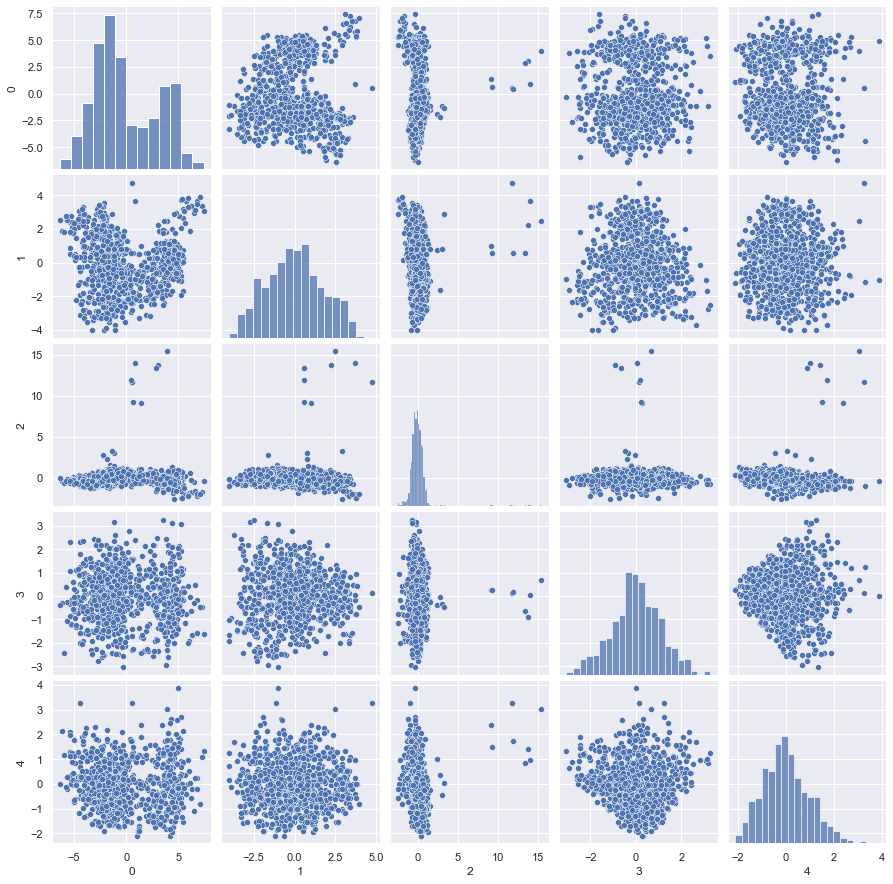

In [85]:
sns.pairplot(pd.DataFrame(Xpca5))

In [86]:
Xpca5.shape

(846, 5)

In [241]:
y.shape

(846,)

In [87]:
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(Xpca5, y, test_size=.20, random_state=1)

In [88]:
#... 3G........ Training SVC with PCA 5 components

X_train_1 = scaler.fit_transform(X_train_1)

X_test_1 = scaler.transform(X_test_1)

clf = SVC(kernel='linear') 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 
print("Train score with PCA 5 features",clf.score(X_train_1,y_train_1))
y_pred_svm_1 = clf.predict(X_test_1)
print("Test score with PCA 5 features",clf.score(X_test_1,y_test_1))
print("Predicted Y with PCA 5 features",y_pred_svm_1)

print("SVC with PCA 5 features - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm_1))
print("SVC with PCA 5 features - Precision",metrics.precision_score(y_test_1, y_pred_svm_1, average="weighted"))
print("SVC with PCA 5 features - Recall   ",metrics.recall_score(y_test_1, y_pred_svm_1, average="weighted"))
print("SVC with PCA 5 features - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm_1, average="weighted"))


Train score with PCA 5 features 0.6878698224852071
Test score with PCA 5 features 0.6705882352941176
Predicted Y with PCA 5 features ['bus' 'car' 'car' 'car' 'car' 'car' 'car' 'van' 'bus' 'car' 'van' 'van'
 'bus' 'bus' 'van' 'car' 'car' 'bus' 'van' 'bus' 'car' 'car' 'car' 'car'
 'van' 'van' 'car' 'car' 'car' 'car' 'van' 'car' 'car' 'car' 'van' 'car'
 'car' 'car' 'car' 'bus' 'car' 'bus' 'van' 'car' 'bus' 'van' 'bus' 'bus'
 'car' 'car' 'car' 'van' 'car' 'car' 'car' 'bus' 'car' 'car' 'bus' 'bus'
 'car' 'van' 'car' 'van' 'bus' 'car' 'car' 'car' 'car' 'bus' 'car' 'car'
 'car' 'van' 'bus' 'van' 'car' 'van' 'van' 'car' 'bus' 'bus' 'car' 'car'
 'bus' 'car' 'van' 'car' 'bus' 'bus' 'car' 'van' 'bus' 'van' 'van' 'van'
 'bus' 'van' 'car' 'car' 'car' 'car' 'van' 'van' 'bus' 'car' 'car' 'car'
 'car' 'car' 'car' 'car' 'car' 'car' 'car' 'van' 'car' 'van' 'bus' 'car'
 'car' 'car' 'car' 'van' 'van' 'car' 'van' 'car' 'van' 'van' 'car' 'car'
 'car' 'car' 'car' 'bus' 'bus' 'car' 'bus' 'bus' 'car' 'car' 'ca

#....... 3H..... Insights on the SVC with PCA 5 components

It is observed that after applying the Dimensionality reduction by PCA 5 components, the train score and test score has reduced

Train score with PCA 5 features 0.6878698224852071
Test score with PCA 5 features 0.6705882352941176

the first SVC had given the following scores

Training set without PCA with 18 original features - 0.9585798816568047
Testing set without PCA with 18 original features - 0.9529411764705882

So even though the accurancy scores have reduced after applying PCA 5 components, the variance is still good

Training - 0.6878 & Testing - 0.6705

# 4. Performance improvement

In [89]:
#...4A... Tuning SVC with hyper parameters by changing values of kernel, C & gamma

clf = SVC(kernel='rbf',C = 1.0,gamma='auto') 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures & rbf, C=1, gamma='auto' - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures & rbf, C=1, gamma='auto' - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures & rbf, C=1, gamma='auto' - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures & rbf, C=1, gamma='auto' - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures & rbf, C=1, gamma='auto' - Accuracy  0.7647058823529411
SVC Tuning with PCA 5 feateures & rbf, C=1, gamma='auto' - Precision 0.7680456095481671
SVC Tuning with PCA 5 feateures & rbf, C=1, gamma='auto' - Recall    0.7647058823529411
SVC Tuning with PCA 5 feateures & rbf, C=1, gamma='auto' - F1 Score  0.7641675269418904


In [90]:
clf = SVC(kernel='rbf',C = 1.0,gamma=0.1) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures rbf, C=1, gamma=0.1 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures rbf, C=1, gamma=0.1 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=1, gamma=0.1 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=1, gamma=0.1 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures rbf, C=1, gamma=0.1 - Accuracy  0.7352941176470589
SVC Tuning with PCA 5 feateures rbf, C=1, gamma=0.1 - Precision 0.7350656051894442
SVC Tuning with PCA 5 feateures rbf, C=1, gamma=0.1 - Recall    0.7352941176470589
SVC Tuning with PCA 5 feateures rbf, C=1, gamma=0.1 - F1 Score  0.7351326412918109


In [91]:
clf = SVC(kernel='rbf',C = 10.0,gamma=0.1) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures rbf, C=10, gamma=0.1 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures rbf, C=10, gamma=0.1 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=10, gamma=0.1 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=10, gamma=0.1 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures rbf, C=10, gamma=0.1 - Accuracy  0.8
SVC Tuning with PCA 5 feateures rbf, C=10, gamma=0.1 - Precision 0.8013901493276132
SVC Tuning with PCA 5 feateures rbf, C=10, gamma=0.1 - Recall    0.8
SVC Tuning with PCA 5 feateures rbf, C=10, gamma=0.1 - F1 Score  0.7991144889581198


In [92]:
clf = SVC(kernel='rbf',C = 100.0,gamma=0.1) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.1 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.1 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.1 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.1 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.1 - Accuracy  0.8058823529411765
SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.1 - Precision 0.81821432975706
SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.1 - Recall    0.8058823529411765
SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.1 - F1 Score  0.8058823529411765


In [93]:
clf = SVC(kernel='rbf',C = 100.0,gamma=0.01) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.01 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.01 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.01 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.01 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.01 - Accuracy  0.7411764705882353
SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.01 - Precision 0.7378605259375339
SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.01 - Recall    0.7411764705882353
SVC Tuning with PCA 5 feateures rbf, C=100, gamma=0.01 - F1 Score  0.7390252300624871


In [94]:
clf = SVC(kernel='rbf',C = 10000.0,gamma=0.01) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Accuracy  0.8235294117647058
SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Precision 0.8288524500709374
SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Recall    0.8235294117647058
SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - F1 Score  0.8247829781643972


In [95]:
clf = SVC(kernel='linear',C = 0.1) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures linear, C=0.1 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures linear, C=0.1 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures linear, C=0.1 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures linear, C=0.1 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures linear, C=0.1 - Accuracy  0.6647058823529411
SVC Tuning with PCA 5 feateures linear, C=0.1 - Precision 0.6577564359076965
SVC Tuning with PCA 5 feateures linear, C=0.1 - Recall    0.6647058823529411
SVC Tuning with PCA 5 feateures linear, C=0.1 - F1 Score  0.6593503497197056


In [96]:
clf = SVC(kernel='linear',C = 1) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures linear, C=1 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures linear, C=1 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures linear, C=1 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures linear, C=1 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures linear, C=1 - Accuracy  0.6705882352941176
SVC Tuning with PCA 5 feateures linear, C=1 - Precision 0.6661869299640197
SVC Tuning with PCA 5 feateures linear, C=1 - Recall    0.6705882352941176
SVC Tuning with PCA 5 feateures linear, C=1 - F1 Score  0.6672787493375729


In [97]:
clf = SVC(kernel='linear',C = 10) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures linear, C=10 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures linear, C=10 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures linear, C=10 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures linear, C=10 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures linear, C=10 - Accuracy  0.6647058823529411
SVC Tuning with PCA 5 feateures linear, C=10 - Precision 0.6593506819513012
SVC Tuning with PCA 5 feateures linear, C=10 - Recall    0.6647058823529411
SVC Tuning with PCA 5 feateures linear, C=10 - F1 Score  0.6609552199258082


In [98]:
clf = SVC(kernel='linear',C = 100) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svm = clf.predict(X_test_1)

print("SVC Tuning with PCA 5 feateures linear, C=100 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svm))
print("SVC Tuning with PCA 5 feateures linear, C=100 - Precision",metrics.precision_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures linear, C=100 - Recall   ",metrics.recall_score(y_test_1, y_pred_svm, average="weighted"))
print("SVC Tuning with PCA 5 feateures linear, C=100 - F1 Score ",metrics.f1_score(y_test_1, y_pred_svm, average="weighted"))


SVC Tuning with PCA 5 feateures linear, C=100 - Accuracy  0.6647058823529411
SVC Tuning with PCA 5 feateures linear, C=100 - Precision 0.6593506819513012
SVC Tuning with PCA 5 feateures linear, C=100 - Recall    0.6647058823529411
SVC Tuning with PCA 5 feateures linear, C=100 - F1 Score  0.6609552199258082


In [ ]:
#... 4B.... Best parameters observed

SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Accuracy  0.8235294117647058
SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Precision 0.8288524500709374
SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - Recall    0.8235294117647058
SVC Tuning with PCA 5 feateures rbf, C=10000, gamma=0.01 - F1 Score  0.8247829781643972


In [ ]:
#.... 4C.... printing classification metrics and sharing Insights with all models

SVC Tuning with PCA 5 features & rbf, C=1, gamma='auto' - Accuracy  0.7647058823529411
SVC Tuning with PCA 5 features & rbf, C=1, gamma='auto' - Precision 0.7680456095481671
SVC Tuning with PCA 5 features & rbf, C=1, gamma='auto' - Recall    0.7647058823529411
SVC Tuning with PCA 5 features & rbf, C=1, gamma='auto' - F1 Score  0.7641675269418904

SVC Tuning with PCA 5 features rbf, C=1, gamma=0.1 - Accuracy  0.7352941176470589
SVC Tuning with PCA 5 features rbf, C=1, gamma=0.1 - Precision 0.7350656051894442
SVC Tuning with PCA 5 features rbf, C=1, gamma=0.1 - Recall    0.7352941176470589
SVC Tuning with PCA 5 features rbf, C=1, gamma=0.1 - F1 Score  0.7351326412918109

SVC Tuning with PCA 5 features rbf, C=10, gamma=0.1 - Accuracy  0.8
SVC Tuning with PCA 5 features rbf, C=10, gamma=0.1 - Precision 0.8013901493276132
SVC Tuning with PCA 5 features rbf, C=10, gamma=0.1 - Recall    0.8
SVC Tuning with PCA 5 features rbf, C=10, gamma=0.1 - F1 Score  0.7991144889581198

SVC Tuning with PCA 5 features rbf, C=100, gamma=0.1 - Accuracy  0.8058823529411765
SVC Tuning with PCA 5 features rbf, C=100, gamma=0.1 - Precision 0.81821432975706
SVC Tuning with PCA 5 features rbf, C=100, gamma=0.1 - Recall    0.8058823529411765
SVC Tuning with PCA 5 features rbf, C=100, gamma=0.1 - F1 Score  0.8058823529411765

SVC Tuning with PCA 5 features rbf, C=100, gamma=0.01 - Accuracy  0.7411764705882353
SVC Tuning with PCA 5 features rbf, C=100, gamma=0.01 - Precision 0.7378605259375339
SVC Tuning with PCA 5 features rbf, C=100, gamma=0.01 - Recall    0.7411764705882353
SVC Tuning with PCA 5 features rbf, C=100, gamma=0.01 - F1 Score  0.7390252300624871

SVC Tuning with PCA 5 features rbf, C=10000, gamma=0.01 - Accuracy  0.8235294117647058
SVC Tuning with PCA 5 features rbf, C=10000, gamma=0.01 - Precision 0.8288524500709374
SVC Tuning with PCA 5 features rbf, C=10000, gamma=0.01 - Recall    0.8235294117647058
SVC Tuning with PCA 5 features rbf, C=10000, gamma=0.01 - F1 Score  0.8247829781643972

It is observed that kernel='rbf' gives better scores than "linear"

Increase of C,(the penalty parameter of the error term) in kernel 'rbf' seems to improve model performance
just an increase of C=1 to 10 improved the performance from 0.73 to 0.8 

further increasing it to 100, 1000 & finally 10000 improved it from 0.8 to 0.82

In [59]:
#..... Using GridSearchCV to figure out the best hyper parameter tuning

from sklearn.model_selection import GridSearchCV

svc= SVC()
parameters = [{"kernel": ["rbf"],"gamma":[0.1,0.01],"C":[0.1,1,10,100,1000,10000]},
              {"kernel": ["linear"],"C": [0.1,1,10,100,1000,10000]}]

cv = GridSearchCV(svc,parameters,cv=5)
cv.fit(X_test_1,y_test_1) 

def display(results):
    print(f'Best parameters are: {results.best_params_}')
    mean_score = results.cv_results_['mean_test_score']
    std_score = results.cv_results_['std_test_score']
    params = results.cv_results_['params']
    for mean,std,params in zip(mean_score,std_score,params):
        print(f'{round(mean,2)} + or -{round(std,2)} for the {params}')

display(cv)

Best parameters are: {'C': 10000, 'gamma': 0.01, 'kernel': 'rbf'}
0.53 + or -0.0 for the {'C': 0.1, 'gamma': 0.1, 'kernel': 'rbf'}
0.53 + or -0.0 for the {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
0.62 + or -0.05 for the {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}
0.53 + or -0.0 for the {'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
0.68 + or -0.06 for the {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
0.62 + or -0.06 for the {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
0.71 + or -0.07 for the {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}
0.6 + or -0.06 for the {'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}
0.64 + or -0.08 for the {'C': 1000, 'gamma': 0.1, 'kernel': 'rbf'}
0.68 + or -0.07 for the {'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}
0.65 + or -0.06 for the {'C': 10000, 'gamma': 0.1, 'kernel': 'rbf'}
0.71 + or -0.1 for the {'C': 10000, 'gamma': 0.01, 'kernel': 'rbf'}
0.57 + or -0.03 for the {'C': 0.1, 'kernel': 'linear'}
0.6 + or -0.07 for the {'C': 1, 'kernel': 'linear'}
0.6 + or -0.08 for the {'C': 10, '

# 5. Data Understanding and Cleaning

#.... 5A....... pre-requisites and assumptions of PCA

Pre-requisites/Assumptions of Principal component Analysis

1. PCA assumes that the principal component with high variance must be paid attention and the PCs with lower variance are 
disregarded as noise. Pearson correlation coefficient framework led to the origin of PCA, and there it was assumed first 
that the axes with high variance would only be turned into principal components.

2. All variables should be accessed on the same ratio level of measurement. The most preferred norm is at least 150 
observations of the sample set with a ratio measurement of 5:1.
    
3. Extreme values that deviate from other data points in any dataset, which are also called outliers, should be less. 
More number of outliers will represent experimental errors and will degrade your ML model/algorithm

4. You should have sampling adequacy, which simply means that for PCA to produce a reliable result, large enough sample 
sizes are required. 
                                     
5. The data should be suitable for data reduction. Effectively, one needs to have adequate correlations between the 
variables in order for variables to be reduced to a smaller number of components. 



#.... 5B... Advantages and Limitations of PCA

Advantages of PCA

a) Removes multi-collinearity   - Multi-collinearity, Co-relation between independent variables are not good for the Machine 
                                  learning performance, PCA combines highly correlated variables into a set of uncorrelated 
                                  orthogonal principal components, effectively eliminating multicollinearity between features
        
b) Decreases computational time - Since it reduces the dimensionality by reducing huge number of independent variables to a 
                                  lesser set of corelated functional components, the trainining and testing of the ML model 
                                  takes lesser time.
        
c) Helps to reduce overfitting -  Overfitting mainly occurs when there are too many variables in the dataset. So, PCA helps 
                                  in overcoming the overfitting issue by reducing the number of features. 

d) Improves Visualization      -  PCA transforms a high dimensional dataset to low dimensional data (2 dimension) so that it 
                                  can be visualized easily.  2D Scree Plot can be used to see which Principal Components 
                                  result in high variance and have more impact as compared to other Principal Components.
    
e) Improves Algorithm performance - With so many features, the performance of algorithm will drastically degrade. PCA will 
                                    speed up the Machine Learning algorithm by getting rid of correlated variables which 
                                    don’t contribute in any decision making. The training time of the algorithms reduces 
                                    significantly with less number of features. So, if the input dimensions are too high, 
                                    then using PCA to speed up the algorithm is a reasonable choice.


Limitations / Disadvantages of PCA

a) Data normalization is a must before applying PCA - Standardization of dataset is a must before implementing PCA, otherwise 
                                                      it will be difficult to find the optimal Principal Components.
    
b) Will result in Some level of information loss    - Due to addressing of outliers and dimensionality reduction there could 
                                                      be some informational loss.  Although Principal Components try to cover 
                                                      maximum variance among the features in a dataset, if we don’t select the 
                                                      right number of Principal Components with care, it may miss some 
                                                      information as compared to the original list of features
    
c) Independent variables will become less interpretable - After implementing PCA on the dataset, the original features 
                                                          will turn into Principal Components. Principal Components are the 
                                                          linear combination of the original features. Principal Components 
                                                          are not as readable and interpretable as original features
            
d) It is not suitable for small data sets 